In [142]:

import os
import glob
import subprocess
import shutil
import matplotlib.pyplot as plt
import numpy as np
from scipy.ndimage import gaussian_filter
from scipy.ndimage import convolve
import pandas as pd
import pickle
from datetime import datetime

object_path = '/data/shared/src/STV/simscenes/LidarSimulation/object_data/'
TEAK_date_gort_out_dir = '/data/shared/src/STV/NEON_TEAK/allen/Gort/Gort.out/2024_09_09/'
TEAK_save_dir = '/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/'
LidarSim_gort_out_dir = '/data/shared/src/STV/simscenes/LidarSimulation/Gort/OrigGORTOutput/2024_09_20/'
IDL_wvfm_dir = '/data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/'

Combined_plot_dir = 'figs/IDL_combined_output/'

In [143]:
def load_objects_from_file(filename, obj_path):
    # Adjust the filename to include the subfolder
    filename = os.path.join(obj_path, filename)
        
    # Load the objects from file
    with open(filename, 'rb') as f:
        objects_list = pickle.load(f)
    
    return objects_list

def get_date_subfolder():
    current_date = datetime.now()
    return current_date.strftime('%Y_%m_%d')

In [144]:
redwood_circle_objects_branch_orig = load_objects_from_file("redwood_circle_objects_orig.pkl", object_path)
redwood_circle_objects_branch_origB10th = load_objects_from_file("redwood_circle_objects_origB10th.pkl", object_path)
guiana_circle_objects_leaf_orig = load_objects_from_file("guiana_circle_objects_leaf_orig.pkl", object_path)
guiana_circle_objects_leaf_div10 = load_objects_from_file("guiana_circle_objects_leaf_div10.pkl", object_path)
guiana_circle_objects_leaf_div30 = load_objects_from_file("guiana_circle_objects_leaf_div30.pkl", object_path)

In [145]:
for circle in redwood_circle_objects_branch_orig:
    print(f"Circle: {circle.circle_name}")
    # print(circle.acc_LAI_leaf)
    # print(circle.acc_LAI_branch)
    print(circle.waveform)
    print(circle.h1)
    print()

Circle: Circle(3, 1)
[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.

In [146]:
def run_gort(input_dir, output_dir, process_dir):
    # Ensure the output directory exists
    os.makedirs(output_dir, exist_ok=True)

    # Find all .in files recursively in the input directory
    fplot = [os.path.join(root, file)
             for root, _, files in os.walk(input_dir)
             for file in files if file.endswith('.in')]

    # Get the current working directory at the start of the script
    initial_dir = os.getcwd()

    # Process each .in file
    for infile in fplot:
        # Get the relative path of the infile with respect to the input directory
        rel_path = os.path.relpath(infile, input_dir)
        
        # Determine the corresponding output file path
        out_file = os.path.join(output_dir, rel_path).replace('.in', '.out')
        
        # Ensure the directory for the output file exists
        os.makedirs(os.path.dirname(out_file), exist_ok=True)
        
        # Copy the input file to gort.in in the process directory
        process_infile = os.path.join(process_dir, 'gort.in')
        shutil.copy(infile, process_infile)
        print(f"Copied {infile} to {process_infile}")
        
        # Change to the process directory
        os.chdir(process_dir)
        
        # Run the Fortran script in the process directory
        cmd_run = './gort_lidar > temp.txt'
        result = subprocess.run(cmd_run, shell=True, capture_output=True, text=True)
        if result.returncode != 0:
            print(f"Error running GORT model: {result.stderr}")
            break
        
        # Move gort.out from the process directory to the corresponding output file path
        process_outfile = os.path.join(process_dir, 'gort.out')
        shutil.move(process_outfile, out_file)
        print(f'Moved {process_outfile} to {out_file}')
        
        # Change back to the initial directory
        os.chdir(initial_dir)
        
def run_gort_teak(input_dir, output_dir, process_dir):
    date_subfolder = get_date_subfolder()

    # Find all .in files recursively in the input directory
    fplot = [os.path.join(root, file)
             for root, _, files in os.walk(input_dir)
             for file in files if file.endswith('.in')]
    
    # Get the current working directory at the start of the script
    initial_dir = os.getcwd()

    # Process each .in file
    for infile in fplot:
        # Get the relative path of the infile with respect to the input directory
        rel_path = os.path.relpath(infile, input_dir)
        
        # Determine the corresponding output file path
        out_file = os.path.join(output_dir, rel_path).replace('.in', '.out')
        
        # Ensure the directory for the output file exists
        os.makedirs(os.path.dirname(out_file), exist_ok=True)
        
        # Copy the input file to gort.in in the process directory
        process_infile = os.path.join(process_dir, 'gort.in')
        shutil.copy(infile, process_infile)
        print(f"Copied {infile} to {process_infile}")
        
        # Change to the process directory
        os.chdir(process_dir)
        
        # Run the Fortran script in the process directory
        cmd_run = './gort_lidar > temp.txt'
        result = subprocess.run(cmd_run, shell=True, capture_output=True, text=True)
        if result.returncode != 0:
            print(f"Error running GORT model: {result.stderr}")
            break
        
        # Move gort.out from the process directory to the corresponding output file path
        process_outfile = os.path.join(process_dir, 'gort.out')
        shutil.move(process_outfile, out_file)
        print(f'Moved {process_outfile} to {out_file}')
        
        # Change back to the initial directory
        os.chdir(initial_dir)
        

In [147]:
input_directory = '/data/shared/src/STV/simscenes/LidarSimulation/Gort/OrigGORTInput/'
output_directory = '/data/shared/src/STV/simscenes/LidarSimulation/Gort/OrigGORTOutput/'
process_directory = '/data/shared/src/STV/simscenes/LidarSimulation/model/'

teak_input_directory = '/data/shared/src/STV/NEON_TEAK/allen/Gort/Gort.in/'
teak_output_directory = '/data/shared/src/STV/NEON_TEAK/allen/Gort/Gort.out/'

run_gort(input_directory, output_directory, process_directory)
run_gort_teak(teak_input_directory, teak_output_directory, process_directory)

Copied /data/shared/src/STV/simscenes/LidarSimulation/Gort/OrigGORTInput/2024_06_19/guiana/Circle_1_1_.in to /data/shared/src/STV/simscenes/LidarSimulation/model/gort.in
Moved /data/shared/src/STV/simscenes/LidarSimulation/model/gort.out to /data/shared/src/STV/simscenes/LidarSimulation/Gort/OrigGORTOutput/2024_06_19/guiana/Circle_1_1_.out
Copied /data/shared/src/STV/simscenes/LidarSimulation/Gort/OrigGORTInput/2024_06_19/guiana/Circle_1_2_.in to /data/shared/src/STV/simscenes/LidarSimulation/model/gort.in
Moved /data/shared/src/STV/simscenes/LidarSimulation/model/gort.out to /data/shared/src/STV/simscenes/LidarSimulation/Gort/OrigGORTOutput/2024_06_19/guiana/Circle_1_2_.out
Copied /data/shared/src/STV/simscenes/LidarSimulation/Gort/OrigGORTInput/2024_06_19/guiana/Circle_1_3_.in to /data/shared/src/STV/simscenes/LidarSimulation/model/gort.in
Moved /data/shared/src/STV/simscenes/LidarSimulation/model/gort.out to /data/shared/src/STV/simscenes/LidarSimulation/Gort/OrigGORTOutput/2024_06_

In [148]:

def return_waveform_array(site_version, out_file_identifier):

    if site_version == 'guiana_orig':
        circle_objects = guiana_circle_objects_leaf_orig
        use_branch = False
    elif site_version == 'guiana_orig_with_branch':
        circle_objects = guiana_circle_objects_leaf_orig
        use_branch = True
    elif site_version == 'guiana_origLD10th':
        circle_objects = guiana_circle_objects_leaf_div10
        use_branch = False
    elif site_version == 'guiana_origLD10th_with_branch':
        circle_objects = guiana_circle_objects_leaf_div10
        use_branch = True
    elif site_version == 'guiana_origLD30th':
        circle_objects = guiana_circle_objects_leaf_div30
        use_branch = False
    elif site_version == 'guiana_origLD30th_with_branch':
        circle_objects = guiana_circle_objects_leaf_div30
        use_branch = True
    elif site_version == 'redwood_orig':
        circle_objects = redwood_circle_objects_branch_orig
        use_branch = False
    elif site_version == 'redwood_orig_with_branch':
        circle_objects = redwood_circle_objects_branch_orig
        use_branch = True
    elif site_version == 'redwood_origB10th':
        circle_objects = redwood_circle_objects_branch_origB10th
        use_branch = False
    elif site_version == 'redwood_origB10th_with_branch':
        circle_objects = redwood_circle_objects_branch_origB10th
        use_branch = True
    else:
        raise ValueError(f"Unsupported site_version: {site_version}")

    # Parse out_file_identifier to find the correct circle name
    filename = os.path.basename(out_file_identifier)
    circle_number = filename.split('_')[1:3]  # Assuming 'Circle_1_1_.out' format
    circle_name = f"Circle({circle_number[0]}, {circle_number[1]})"

    # Find the correct circle object
    for circle in circle_objects:
        if circle_name == circle.circle_name:
            height_array = circle.tree_height_array.tolist()
            if use_branch:
                return height_array, circle.waveform_b.tolist()
            else:
                return height_array, circle.waveform.tolist()
            
    raise ValueError(f"{circle_name} not found in {site_version} circle objects.")

def gsmooth(values, width, peak_scale=1.0):
    # Apply scaling factor to the highest peaks
    max_value = np.max(values)
    scaled_values = np.copy(values)
    scaled_values[values >= max_value * 0.9] *= peak_scale
    
    # Calculate convolution parameters and perform convolution
    N = len(scaled_values)
    N2 = int(np.ceil(width * 8))
    if N2 > N / 2:
        N2 = N // 2
    N2 = int(N2 / 2) * 2 + 1
    g1 = np.exp(-np.arange(-N2//2, N2//2)**2 / (2.0 * width**2))
    g1 = g1 / np.sum(g1)
    
    smoothed_values = convolve(scaled_values, g1, mode='constant', cval=0.0)
    
    return smoothed_values

def read_idl_waveform_data(idl_wvfm_location):
    gwvform_ght = []
    gwvform = []
    
    with open(idl_wvfm_location) as idl:
        for line in idl:
            parts = line.split()
            
            gwvform_ght.append(float(parts[0]))
            gwvform.append(float(parts[1]))
    
    return np.array(gwvform_ght), np.array(gwvform)

def process_out_file(out_file):
    
    with open(out_file, 'r') as f:
        gn_level, dz = map(float, f.readline().split())
        n_ext = int(10.0 / dz)
        n_tot = int(gn_level + n_ext)

        height_array = np.zeros(n_tot, dtype=np.float32)
        waveform_array = np.zeros(n_tot, dtype=np.float32)

        height_array[:n_ext] = np.arange(n_ext) * dz - 10  # extend height to below ground 10m deep

        for _ in range(3):
            f.readline()  # skip lines

        for ilevel in range(int(gn_level)):
            line = f.readline().strip()
            parts = line.split()
            parts = [float(part) for part in parts]
            height_array[ilevel + n_ext] = parts[0]
            waveform_array[ilevel + n_ext] = parts[-1]

        width = int(0.6 / dz) + 1
        # smoothed_waveform = gaussian_filter(waveform_array, sigma=width, mode='nearest')
        smoothed_waveform = gsmooth(waveform_array, width, peak_scale=0.95)

    return height_array, smoothed_waveform, n_ext, dz

def process_new_gort_waveform(new_gort_waveform, height_array, n_ext, dz):

    new_gort_ght = np.zeros(len(new_gort_waveform) + n_ext, dtype=np.float32)
    new_gort_waveform_ext = np.zeros(len(new_gort_waveform) + n_ext, dtype=np.float32)
    new_gort_normalized_waveform = np.zeros(len(new_gort_waveform) + n_ext, dtype=np.float32)

    for new_gort_ilevel in range(len(new_gort_waveform)):
        new_gort_ght[new_gort_ilevel + n_ext] = height_array[new_gort_ilevel]
        new_gort_waveform_ext[new_gort_ilevel + n_ext] = new_gort_waveform[new_gort_ilevel]

    width = int(0.6 / dz) + 1
    new_gort_normalized_waveform = gaussian_filter(new_gort_waveform_ext, sigma=width, mode='nearest')

    return new_gort_ght, new_gort_normalized_waveform

def generate_waveform_plots(out_base_dir, idl_base_dir, teak_dir, subfolder_name):
    script_dir = os.getcwd()
    base_dir = os.path.dirname(script_dir)
    
    # Parse the end part of out_base_dir as the folder name
    base_dir_name = os.path.basename(out_base_dir.strip('/'))

    # Ensure the subfolder exists in the current working directory
    print(f"base dir: {base_dir}")
    save_dir = os.path.join(base_dir, subfolder_name, base_dir_name, "waveform")
    print(f"saved to: {save_dir}")
    os.makedirs(save_dir, exist_ok=True)
    
    # Get all .out files in the output directory and subdirectories
    out_files = glob.glob(os.path.join(out_base_dir, '**', '*.out'), recursive=True)

    # Ensure we have at least 9 .out files to create a 3x3 plot
    if len(out_files) < 9:
        print("Not enough .out files found.")
        return
    
    # # Get all .out files from TEAK folder
    # teak_100_files = glob.glob(os.path.join(teak_dir, 'Gort_100', '**', '*.out'), recursive=True)
    # teak_400_files = glob.glob(os.path.join(teak_dir, 'Gort_400', '**', '*.out'), recursive=True)

    # # Process Gort_100 .out files into arrays
    # gort_100_waveforms = []
    # for teak_100_file in teak_100_files:
    #     # Process teak_100_file and extract waveform data into an array
    #     height_array, waveform_array, n, d = process_out_file(teak_100_file)
    #     gort_100_waveforms.append((height_array, waveform_array))
    
    # # Process Gort_400 .out files into arrays
    # gort_400_waveforms = []
    # for teak_400_file in teak_400_files:
    #     # Process teak_400_file and extract waveform data into an array
    #     height_array, waveform_array, n, d = process_out_file(teak_400_file)
    #     gort_400_waveforms.append((height_array, waveform_array))
    
    # Group the .out files into sets of 9
    file_groups = [out_files[i:i + 9] for i in range(0, len(out_files), 9)]
    
    for group_index, file_group in enumerate(file_groups):
        fig, axes = plt.subplots(3, 3, figsize=(15, 15))
        
        # Determine the plot filename based on the subfolder names of the .out files
        rel_path = os.path.relpath(file_group[0], out_base_dir)  # Get relative path from out_base_dir
        subfolder_names = rel_path.split(os.sep)[:-1]  # Exclude last segments (filename)
        subplot_title = '_'.join(subfolder_names)
        
        # Remove any slashes from the subfolder_filename
        subplot_title = subplot_title.replace('/', '')
        
        # Set suptitle with enough space at the top
        fig.suptitle(subplot_title, y=0.98, fontsize=24)
        
        for idx, out_file in enumerate(file_group):
            row = idx // 3
            col = idx % 3
            
            # Determine the out_file identifier (e.g., Circle_1_1_)
            out_file_identifier = os.path.basename(out_file).split('.')[0]
            print(out_file_identifier, subplot_title)
            
            # Retrieve arrays from return_arrays function
            height_array, new_gort_waveform = return_waveform_array(subplot_title, out_file_identifier)
            # print(new_gort_waveform)
            
            idl_subfolder_names = '/'.join(subfolder_names)
            idl_wvfm_location = os.path.join(idl_base_dir, idl_subfolder_names, f"{out_file_identifier}.in.gwvfm.txt")

            print(f"idl_wvfm_location: {idl_wvfm_location}")
            
            # Read IDL waveform data using the function
            gwvform_ght, gwvform = read_idl_waveform_data(idl_wvfm_location)
            ght, smoothed_wave, n_ext, dz = process_out_file(out_file)
            new_gort_ght, new_gort_normalized_waveform = process_new_gort_waveform(new_gort_waveform, height_array, n_ext, dz)

            # axes[row, col].plot(teak_waveform_array, teak_height_array, label=f'{teak_100_filename} (100m2)', color='green')
            axes[row, col].plot(new_gort_normalized_waveform, new_gort_ght, label='New GORT Gaussian', color='blue')
            axes[row, col].plot(smoothed_wave, ght, label='Old GORT Gaussian Python', color='red')
            axes[row, col].plot(gwvform, gwvform_ght, label='Old GORT Gaussian IDL', color='black', linestyle=':')
            
            axes[row, col].set_title(f"{os.path.basename(out_file)}")
            axes[row, col].set_xlabel('Normalized WF', fontsize=15)
            axes[row, col].set_ylabel('Height (m)', fontsize=15)
            axes[row, col].grid(True, which='both', linestyle='--', linewidth=0.5)
            axes[row, col].minorticks_on()
            axes[row, col].tick_params(labelsize=8, width=1)
            
            # Conditionally set x-axis limits based on subfolder name
            if 'redwood' in subplot_title:
                axes[row, col].set_xlim(0, 0.3)
            elif 'guiana' in subplot_title:
                axes[row, col].set_xlim(0, 0.5)
                
            axes[row, col].set_ylim(-5, 40)
            # Add legend to the subplot
            axes[row, col].legend(fontsize='small', facecolor='lightgrey', framealpha=0.5)
                
        # Adjust layout and save the plot
        fig.subplots_adjust(top=0.92, hspace=0.4)
        
        plot_filename_pdf = os.path.join(save_dir, f"{subplot_title}.pdf")
        plot_filename_png = os.path.join(save_dir, f"{subplot_title}.png")
        print(plot_filename_pdf)
        
        plt.savefig(plot_filename_pdf)
        plt.savefig(plot_filename_png)
        plt.show()
        plt.close(fig)  # Close the figure to release memory
        
def generate_teak_waveform(teak_dir, save_dir):

    fig, axes = plt.subplots(1, 2, figsize=(25, 15))
    
    gort_100_type = 'Gort_100'
    gort_400_type = 'Gort_400'
    
    # Get all .out files from TEAK folder
    teak_100_files = glob.glob(os.path.join(teak_dir, gort_100_type, '**', '*.out'), recursive=True)
    teak_400_files = glob.glob(os.path.join(teak_dir, gort_400_type, '**', '*.out'), recursive=True)

    # Process Gort_100 .out files into arrays
    gort_100_waveforms = []
    for teak_100_file in teak_100_files:
        # Process teak_100_file and extract waveform data into an array
        height_array, waveform_array, n, d = process_out_file(teak_100_file)
        gort_100_waveforms.append((height_array, waveform_array))
        print(waveform_array)
    # Process Gort_400 .out files into arrays
    gort_400_waveforms = []
    for teak_400_file in teak_400_files:
        # Process teak_400_file and extract waveform data into an array
        height_array, waveform_array, n, d = process_out_file(teak_400_file)
        gort_400_waveforms.append((height_array, waveform_array))
        print(waveform_array)

    # Plot teak arrays from gort_400_waveforms corresponding to current idx
    for teak_400_idx, teak_400_file in enumerate(teak_400_files):
        teak_400_filename = os.path.basename(teak_400_files[teak_400_idx])
        teak_400_height_array, teak_400_waveform_array = gort_400_waveforms[teak_400_idx]
        colors = ['blue', 'red', 'brown', 'orange', 'green'][teak_400_idx % 5]  # Cycle through colors
        axes[0].plot(teak_400_waveform_array, teak_400_height_array,
                            label=f'{teak_400_filename} (400m2)', color = colors)
        axes[0].legend(fontsize='small', facecolor='lightgrey', framealpha=0.5)
        
    axes[0].set_title(gort_400_type, fontsize=30)
    axes[0].set_xlim(0, 0.7)
    axes[0].set_ylim(-10, 40)
    axes[0].set_xlabel('Normalized WF', fontsize=30)
    axes[0].set_ylabel('Height (m)', fontsize=30)
    axes[0].grid(True, which='both', linestyle='--', linewidth=0.5)
    axes[0].minorticks_on()
    axes[0].tick_params(labelsize=8, width=1)

    colormap = plt.cm.get_cmap('coolwarm')
    colors = colormap(np.linspace(0, 1, 21))
    
    # Plot teak arrays from gort_100_waveforms corresponding to current idx
    for teak_100_idx, teak_100_file in enumerate(teak_100_files):
        teak_100_filename = os.path.basename(teak_100_files[teak_100_idx])
        teak_100_height_array, teak_100_waveform_array = gort_100_waveforms[teak_100_idx]

        axes[1].plot(teak_100_waveform_array, teak_100_height_array,
                            label=f'{teak_100_filename} (100m2)', color = colors[teak_100_idx])
        axes[1].legend(fontsize='small', facecolor='lightgrey', framealpha=0.5)

    axes[1].set_title(gort_100_type, fontsize=30)
    axes[1].set_xlim(0, 0.7)
    axes[1].set_ylim(-10, 40)
    axes[1].set_xlabel('Normalized WF', fontsize=30)
    axes[1].set_ylabel('Height (m)', fontsize=30)
    axes[1].grid(True, which='both', linestyle='--', linewidth=0.5)
    axes[1].minorticks_on()
    axes[1].tick_params(labelsize=8, width=1)
    
    plot_filename = os.path.join(save_dir, "TEAK_field_waveforms.pdf")
    plot_filename2 = os.path.join(save_dir, "TEAK_field_waveforms.png")
    print(plot_filename)
    
    plt.savefig(plot_filename)
    plt.savefig(plot_filename2)
    plt.show()
    plt.close(fig)  # Close the figure to release memory

[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.000000

/tmp/ipykernel_848345/1455225256.py:283: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('coolwarm')


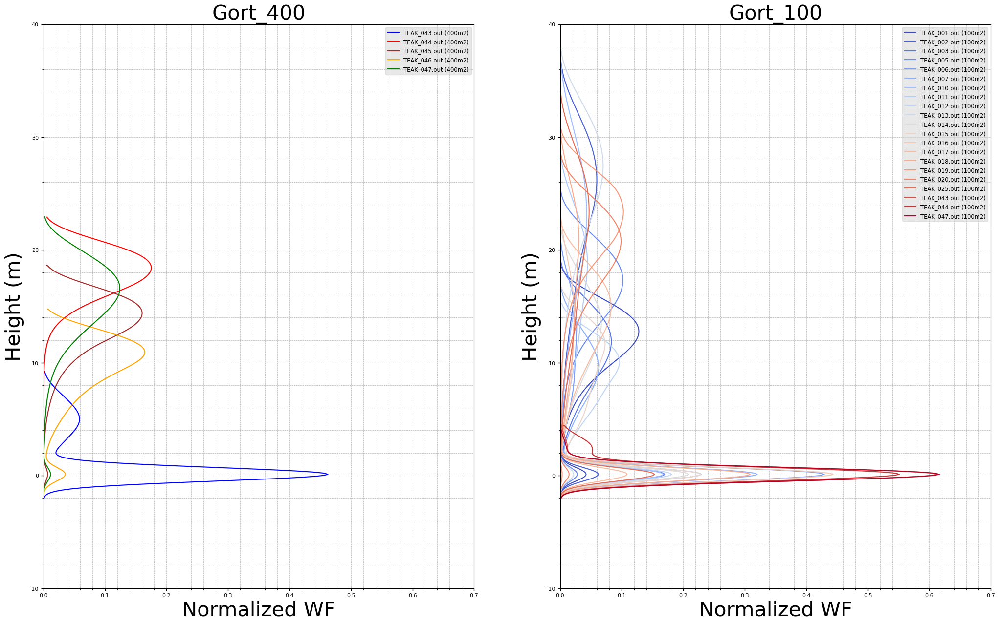

In [149]:
generate_teak_waveform(TEAK_date_gort_out_dir, TEAK_save_dir)

base dir: /data/shared/src/STV/simscenes/LidarSimulation
saved to: /data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/waveform
Circle_3_1_ redwood_orig
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/redwood/orig/Circle_3_1_.in.gwvfm.txt
Circle_3_2_ redwood_orig
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/redwood/orig/Circle_3_2_.in.gwvfm.txt
Circle_3_3_ redwood_orig
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/redwood/orig/Circle_3_3_.in.gwvfm.txt
Circle_2_1_ redwood_orig
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/redwood/orig/Circle_2_1_.in.gwvfm.txt
Circle_2_2_ redwood_orig
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/redwood/orig/Circle_2_2_.in.gwvfm.txt
Circle_2_3_ redwood_orig
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_t

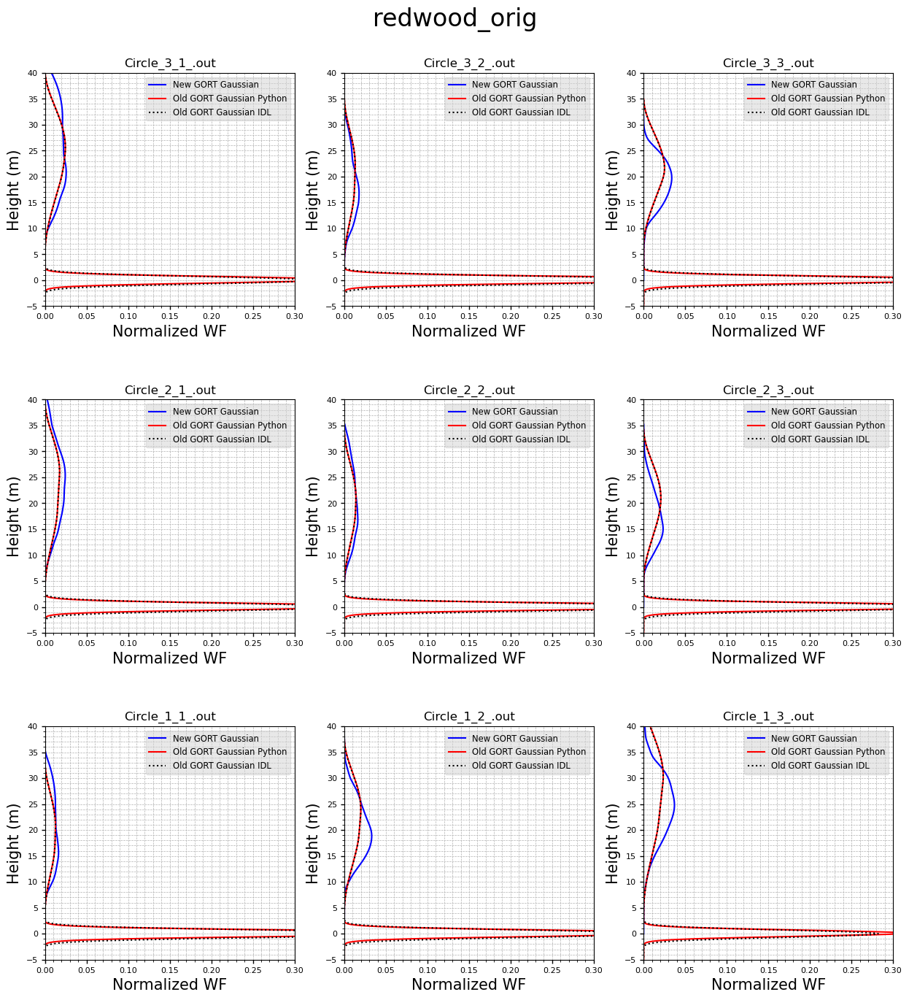

Circle_3_1_branch redwood_orig_with_branch
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/redwood/orig/with_branch/Circle_3_1_branch.in.gwvfm.txt
Circle_3_2_branch redwood_orig_with_branch
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/redwood/orig/with_branch/Circle_3_2_branch.in.gwvfm.txt
Circle_3_3_branch redwood_orig_with_branch
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/redwood/orig/with_branch/Circle_3_3_branch.in.gwvfm.txt
Circle_2_1_branch redwood_orig_with_branch
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/redwood/orig/with_branch/Circle_2_1_branch.in.gwvfm.txt
Circle_2_2_branch redwood_orig_with_branch
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/redwood/orig/with_branch/Circle_2_2_branch.in.gwvfm.txt
Circle_2_3_branch redwood_orig_with_branch
idl_wvfm_location: /data/shared/

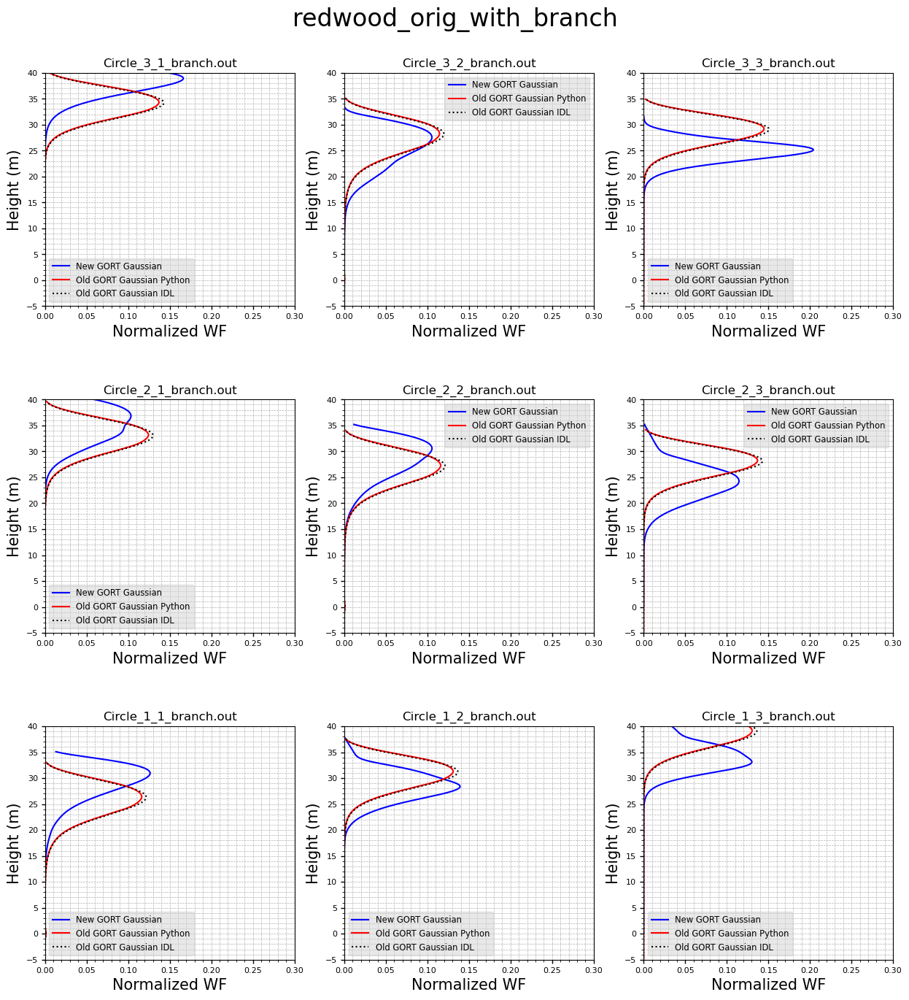

Circle_3_1_ redwood_origB10th
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/redwood/origB10th/Circle_3_1_.in.gwvfm.txt
Circle_3_2_ redwood_origB10th
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/redwood/origB10th/Circle_3_2_.in.gwvfm.txt
Circle_3_3_ redwood_origB10th
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/redwood/origB10th/Circle_3_3_.in.gwvfm.txt
Circle_2_1_ redwood_origB10th
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/redwood/origB10th/Circle_2_1_.in.gwvfm.txt
Circle_2_2_ redwood_origB10th
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/redwood/origB10th/Circle_2_2_.in.gwvfm.txt
Circle_2_3_ redwood_origB10th
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/redwood/origB10th/Circle_2_3_.in.gwvfm.txt
Circle_1_1_ redwood_origB10th
idl_wvfm_locatio

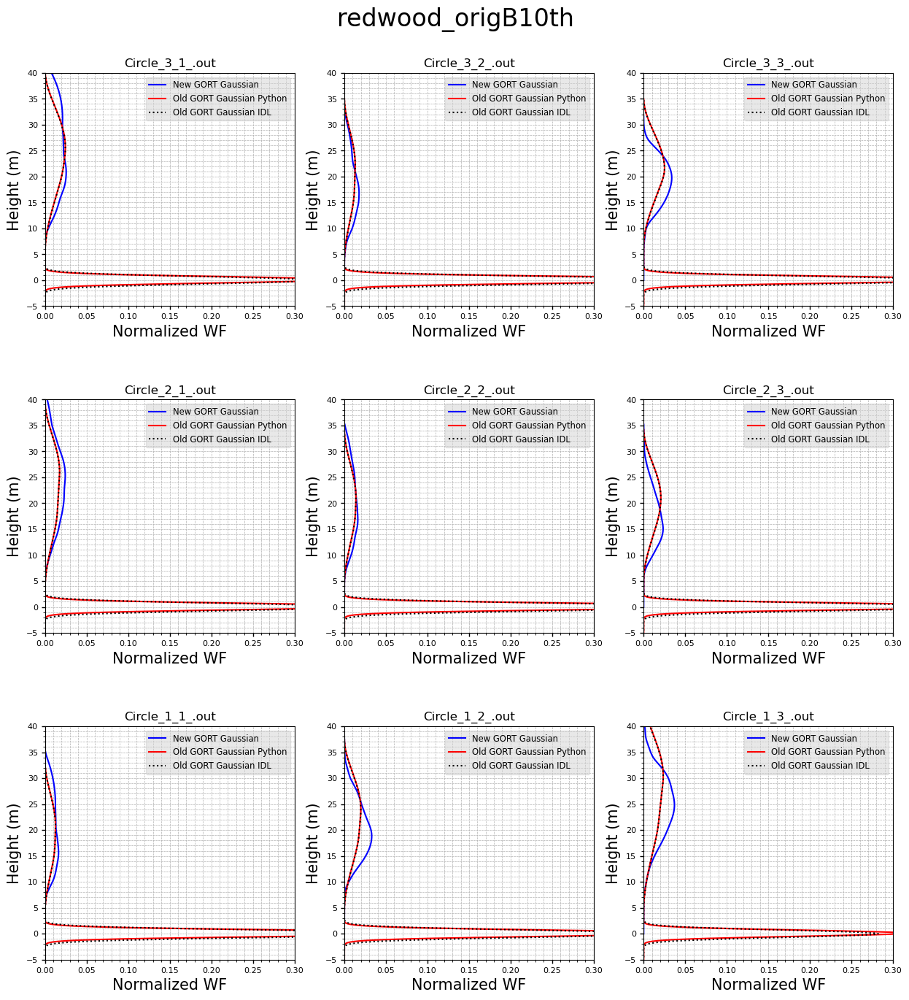

Circle_3_1_branch redwood_origB10th_with_branch
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/redwood/origB10th/with_branch/Circle_3_1_branch.in.gwvfm.txt
Circle_3_2_branch redwood_origB10th_with_branch
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/redwood/origB10th/with_branch/Circle_3_2_branch.in.gwvfm.txt
Circle_3_3_branch redwood_origB10th_with_branch
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/redwood/origB10th/with_branch/Circle_3_3_branch.in.gwvfm.txt
Circle_2_1_branch redwood_origB10th_with_branch
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/redwood/origB10th/with_branch/Circle_2_1_branch.in.gwvfm.txt
Circle_2_2_branch redwood_origB10th_with_branch
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/redwood/origB10th/with_branch/Circle_2_2_branch.in.gwvfm.txt
Circle_2_3_branch redwood

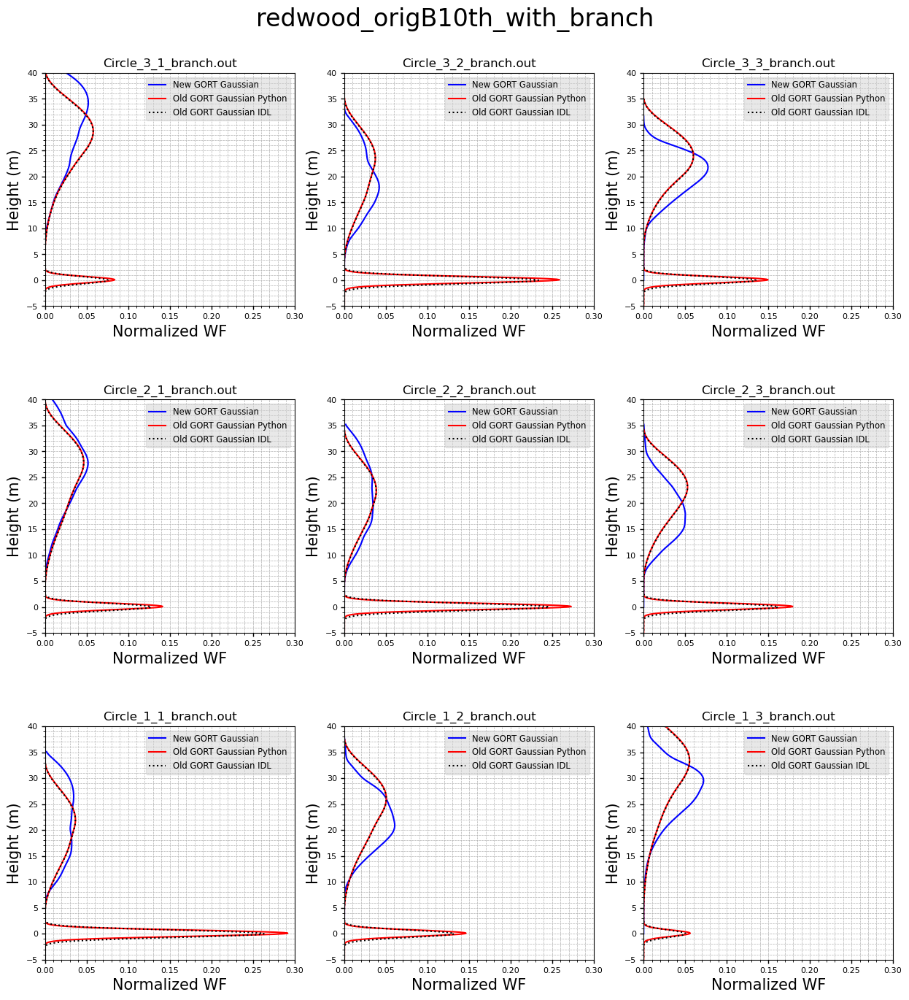

Circle_3_1_ guiana_orig
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/orig/Circle_3_1_.in.gwvfm.txt
Circle_3_2_ guiana_orig
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/orig/Circle_3_2_.in.gwvfm.txt
Circle_3_3_ guiana_orig
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/orig/Circle_3_3_.in.gwvfm.txt
Circle_2_1_ guiana_orig
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/orig/Circle_2_1_.in.gwvfm.txt
Circle_2_2_ guiana_orig
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/orig/Circle_2_2_.in.gwvfm.txt
Circle_2_3_ guiana_orig
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/orig/Circle_2_3_.in.gwvfm.txt
Circle_1_1_ guiana_orig
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/o

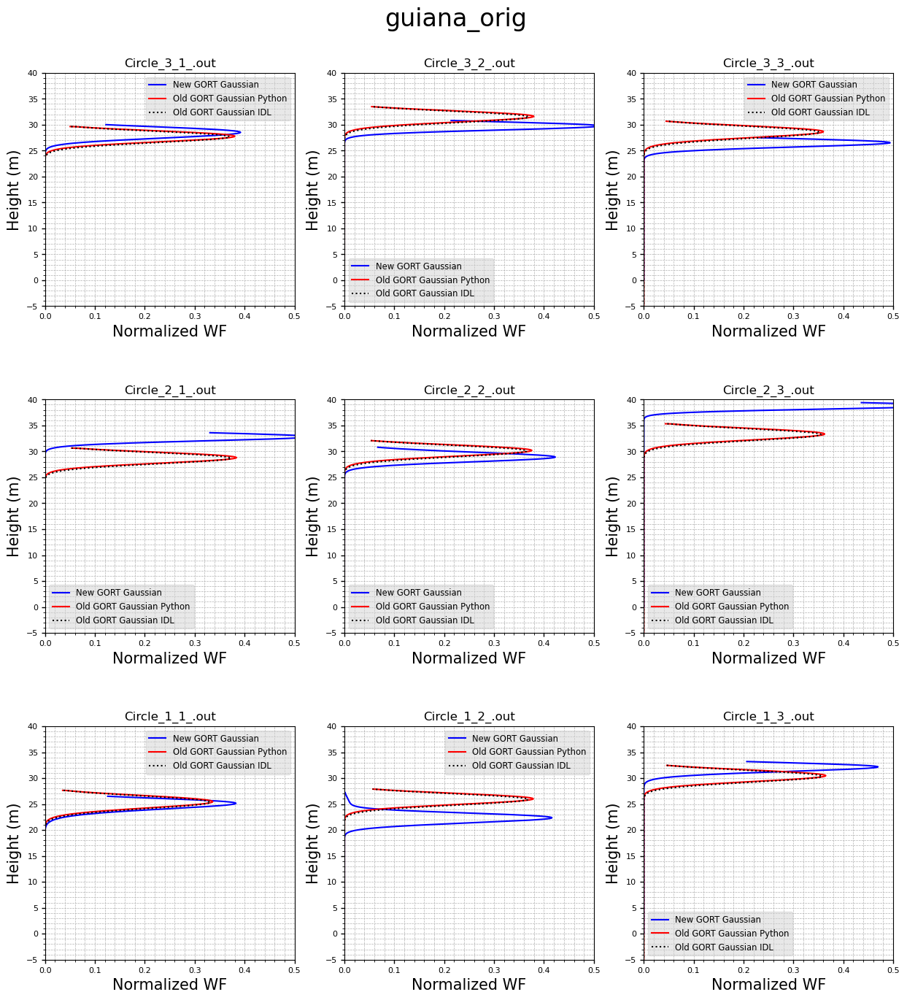

Circle_3_1_branch guiana_orig_with_branch
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/orig/with_branch/Circle_3_1_branch.in.gwvfm.txt
Circle_3_2_branch guiana_orig_with_branch
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/orig/with_branch/Circle_3_2_branch.in.gwvfm.txt
Circle_3_3_branch guiana_orig_with_branch
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/orig/with_branch/Circle_3_3_branch.in.gwvfm.txt
Circle_2_1_branch guiana_orig_with_branch
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/orig/with_branch/Circle_2_1_branch.in.gwvfm.txt
Circle_2_2_branch guiana_orig_with_branch
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/orig/with_branch/Circle_2_2_branch.in.gwvfm.txt
Circle_2_3_branch guiana_orig_with_branch
idl_wvfm_location: /data/shared/src/STV/sim

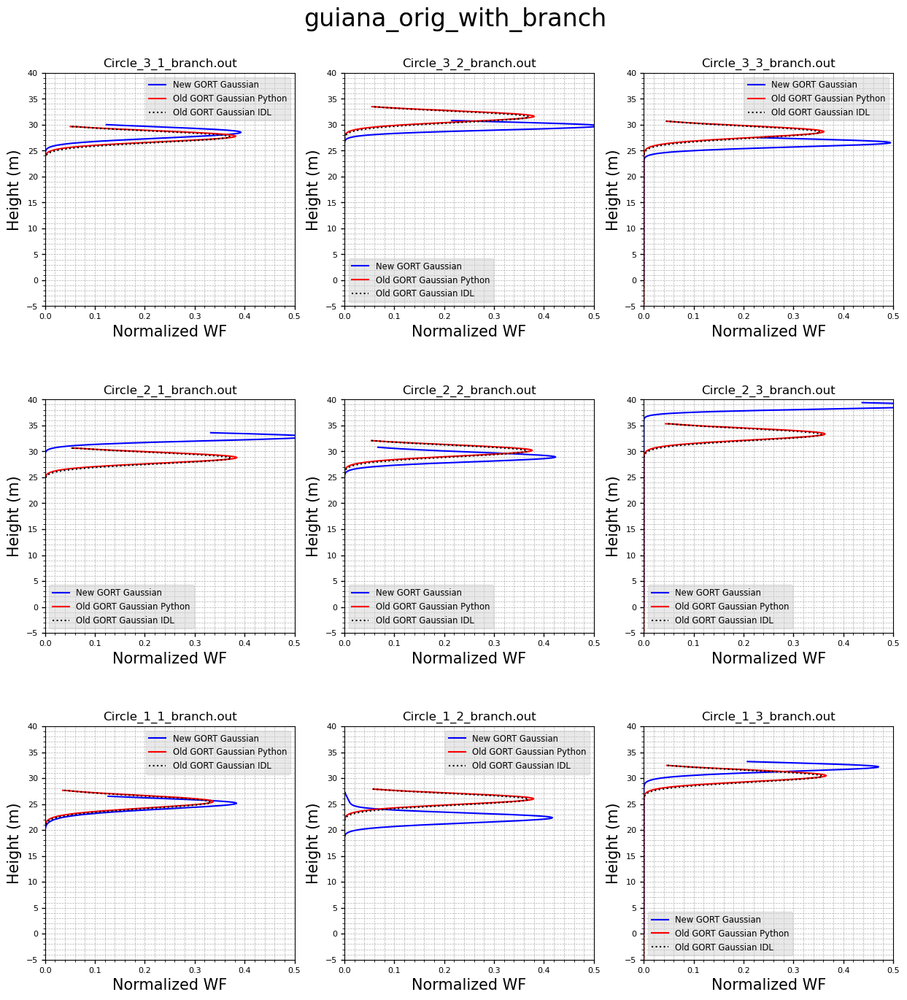

Circle_3_1_ guiana_origLD10th
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/origLD10th/Circle_3_1_.in.gwvfm.txt
Circle_3_2_ guiana_origLD10th
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/origLD10th/Circle_3_2_.in.gwvfm.txt
Circle_3_3_ guiana_origLD10th
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/origLD10th/Circle_3_3_.in.gwvfm.txt
Circle_2_1_ guiana_origLD10th
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/origLD10th/Circle_2_1_.in.gwvfm.txt
Circle_2_2_ guiana_origLD10th
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/origLD10th/Circle_2_2_.in.gwvfm.txt
Circle_2_3_ guiana_origLD10th
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/origLD10th/Circle_2_3_.in.gwvfm.txt
Circle_1_1_ guiana_origLD10th
idl_wvfm_locatio

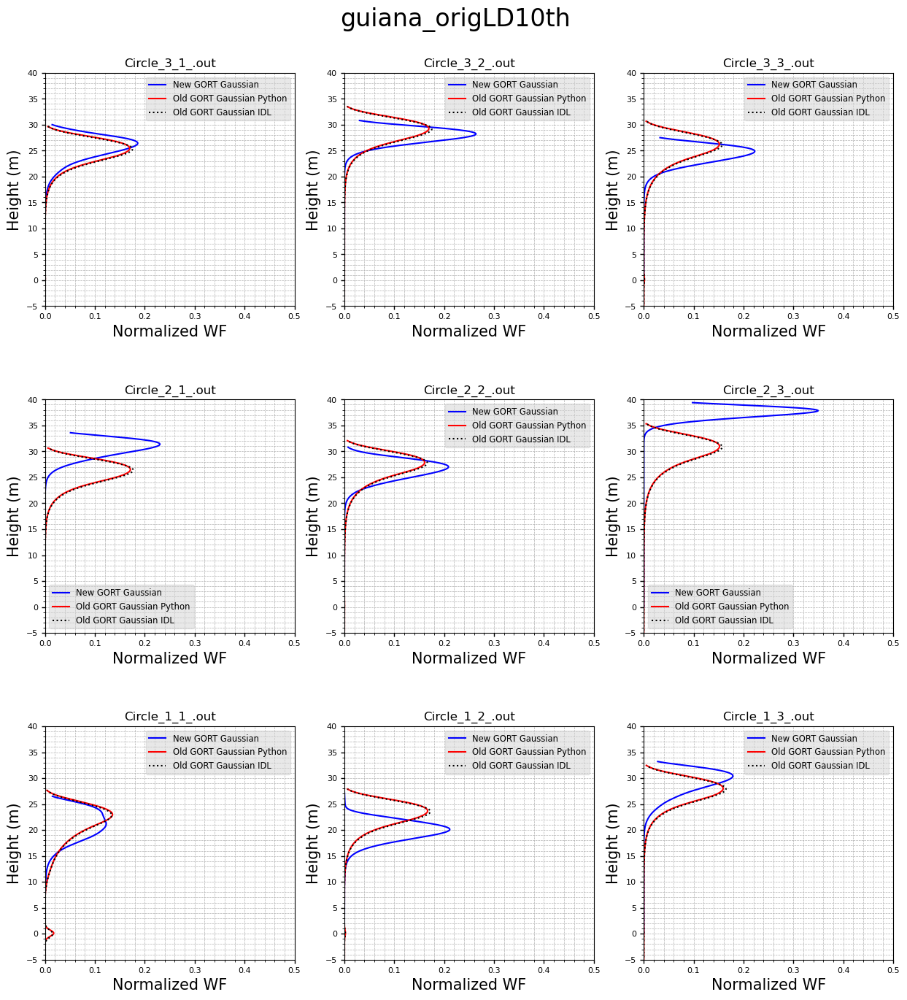

Circle_3_1_branch guiana_origLD10th_with_branch
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/origLD10th/with_branch/Circle_3_1_branch.in.gwvfm.txt
Circle_3_2_branch guiana_origLD10th_with_branch
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/origLD10th/with_branch/Circle_3_2_branch.in.gwvfm.txt
Circle_3_3_branch guiana_origLD10th_with_branch
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/origLD10th/with_branch/Circle_3_3_branch.in.gwvfm.txt
Circle_2_1_branch guiana_origLD10th_with_branch
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/origLD10th/with_branch/Circle_2_1_branch.in.gwvfm.txt
Circle_2_2_branch guiana_origLD10th_with_branch
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/origLD10th/with_branch/Circle_2_2_branch.in.gwvfm.txt
Circle_2_3_branch guiana_

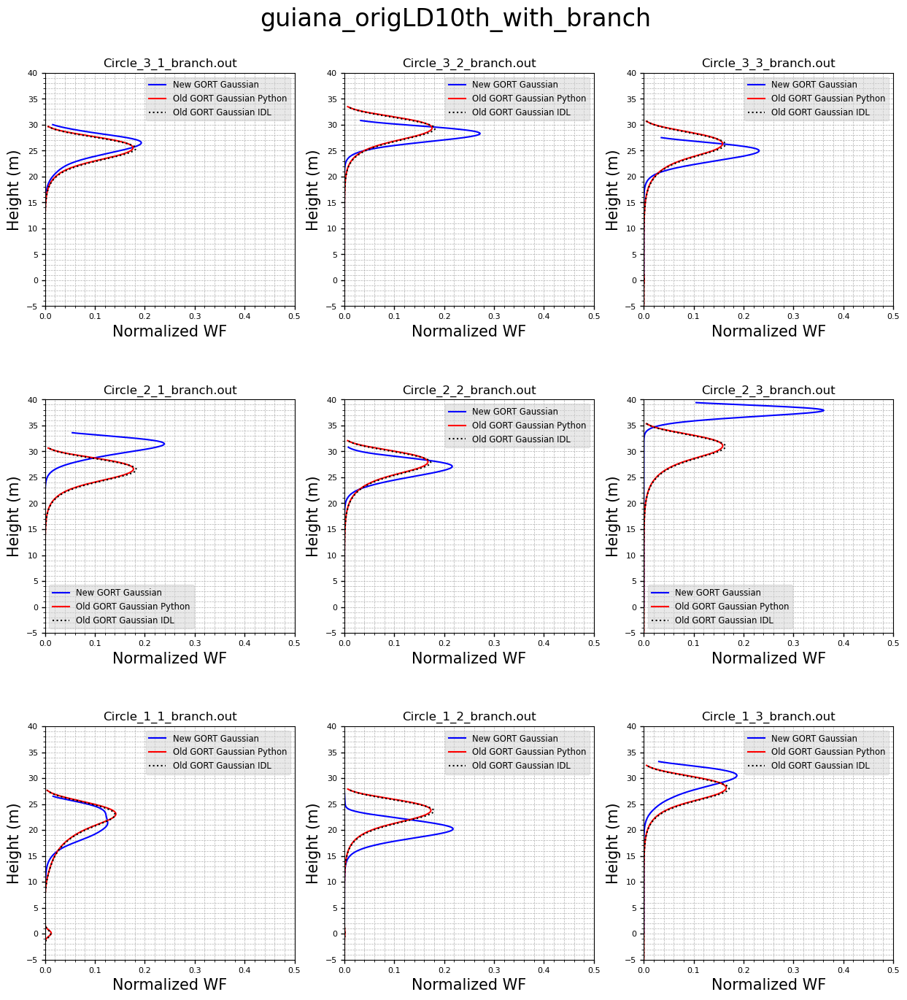

Circle_3_1_ guiana_origLD30th
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/origLD30th/Circle_3_1_.in.gwvfm.txt
Circle_3_2_ guiana_origLD30th
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/origLD30th/Circle_3_2_.in.gwvfm.txt
Circle_3_3_ guiana_origLD30th
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/origLD30th/Circle_3_3_.in.gwvfm.txt
Circle_2_1_ guiana_origLD30th
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/origLD30th/Circle_2_1_.in.gwvfm.txt
Circle_2_2_ guiana_origLD30th
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/origLD30th/Circle_2_2_.in.gwvfm.txt
Circle_2_3_ guiana_origLD30th
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/origLD30th/Circle_2_3_.in.gwvfm.txt
Circle_1_1_ guiana_origLD30th
idl_wvfm_locatio

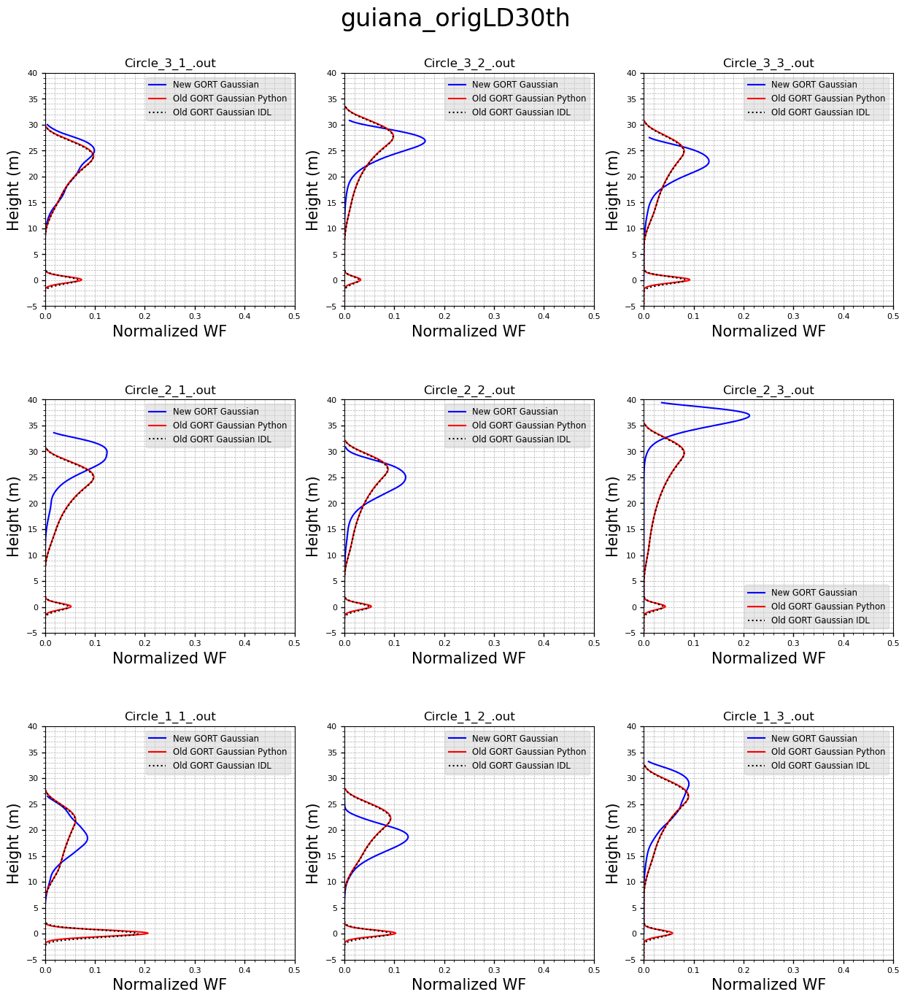

Circle_3_1_branch guiana_origLD30th_with_branch
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/origLD30th/with_branch/Circle_3_1_branch.in.gwvfm.txt
Circle_3_2_branch guiana_origLD30th_with_branch
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/origLD30th/with_branch/Circle_3_2_branch.in.gwvfm.txt
Circle_3_3_branch guiana_origLD30th_with_branch
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/origLD30th/with_branch/Circle_3_3_branch.in.gwvfm.txt
Circle_2_1_branch guiana_origLD30th_with_branch
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/origLD30th/with_branch/Circle_2_1_branch.in.gwvfm.txt
Circle_2_2_branch guiana_origLD30th_with_branch
idl_wvfm_location: /data/shared/src/STV/simscenes/LidarSimulation/IDL_test/2024_09_20/guiana/origLD30th/with_branch/Circle_2_2_branch.in.gwvfm.txt
Circle_2_3_branch guiana_

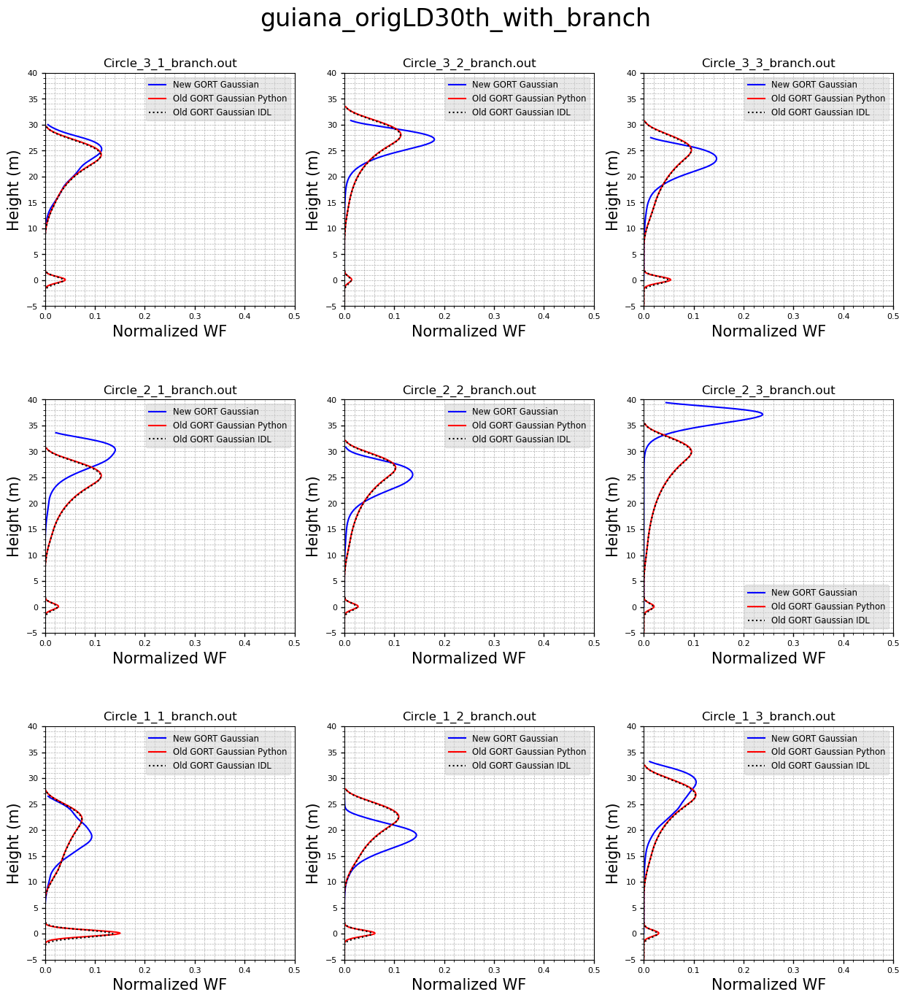

In [150]:
generate_waveform_plots(LidarSim_gort_out_dir, IDL_wvfm_dir, TEAK_date_gort_out_dir, Combined_plot_dir)

In [151]:

def return_Li_dz_array(site_version, out_file_identifier):

    if site_version == 'guiana_orig':
        circle_objects = guiana_circle_objects_leaf_orig
        use_branch = False
    elif site_version == 'guiana_orig_with_branch':
        circle_objects = guiana_circle_objects_leaf_orig
        use_branch = True
    elif site_version == 'guiana_origLD10th':
        circle_objects = guiana_circle_objects_leaf_div10
        use_branch = False
    elif site_version == 'guiana_origLD10th_with_branch':
        circle_objects = guiana_circle_objects_leaf_div10
        use_branch = True
    elif site_version == 'guiana_origLD30th':
        circle_objects = guiana_circle_objects_leaf_div30
        use_branch = False
    elif site_version == 'guiana_origLD30th_with_branch':
        circle_objects = guiana_circle_objects_leaf_div30
        use_branch = True
    elif site_version == 'redwood_orig':
        circle_objects = redwood_circle_objects_branch_orig
        use_branch = False
    elif site_version == 'redwood_orig_with_branch':
        circle_objects = redwood_circle_objects_branch_orig
        use_branch = True
    elif site_version == 'redwood_origB10th':
        circle_objects = redwood_circle_objects_branch_origB10th
        use_branch = False
    elif site_version == 'redwood_origB10th_with_branch':
        circle_objects = redwood_circle_objects_branch_origB10th
        use_branch = True
    else:
        raise ValueError(f"Unsupported site_version: {site_version}")

    # Parse out_file_identifier to find the correct circle name
    filename = os.path.basename(out_file_identifier)
    circle_number = filename.split('_')[1:3]  # Assuming 'Circle_1_1_.out' format
    circle_name = f"Circle({circle_number[0]}, {circle_number[1]})"

    # Find the correct circle object
    for circle in circle_objects:
        if circle_name == circle.circle_name:
            height_array = circle.tree_height_array.tolist()
            if use_branch:
                return height_array, circle.total_Li_dz_branch.tolist()
            else:
                return height_array, circle.total_Li_dz_leaf.tolist()
            
    raise ValueError(f"{circle_name} not found in {site_version} circle objects.")


def generate_fp_plots(out_base_dir, subfolder_name):
    script_dir = os.getcwd()
    
    # Remove the last subdirectory
    parent_dir = os.path.dirname(script_dir)
    
    # Parse the end part of out_base_dir as the folder name
    base_dir_name = os.path.basename(out_base_dir.strip('/'))

    # Ensure the subfolder exists in the current working directory
    save_dir = os.path.join(parent_dir, subfolder_name, base_dir_name, "foliage_profile")
    os.makedirs(save_dir, exist_ok=True)
    
    # Get all .out files in the output directory and subdirectories
    out_files = glob.glob(os.path.join(out_base_dir, '**', '*.out'), recursive=True)
    
    # Ensure we have at least 9 .out files to create a 3x3 plot
    if len(out_files) < 9:
        print("Not enough .out files found.")
        return
    
    # Group the .out files into sets of 9
    file_groups = [out_files[i:i + 9] for i in range(0, len(out_files), 9)]
    
    for group_index, file_group in enumerate(file_groups):
        fig, axes = plt.subplots(3, 3, figsize=(15, 15))
        
        # Determine the plot filename based on the subfolder names of the .out files
        rel_path = os.path.relpath(file_group[0], out_base_dir)  # Get relative path from out_base_dir
        subfolder_names = rel_path.split(os.sep)[:-1]  # Exclude last segments (filename)
        subfolder_filename = '_'.join(subfolder_names)
        
        # Remove any slashes from the subfolder_filename
        subfolder_filename = subfolder_filename.replace('/', '')
        
        # Set suptitle with enough space at the top
        fig.suptitle(subfolder_filename, y=0.98, fontsize=24)
        
        for idx, out_file in enumerate(file_group):
            row = idx // 3
            col = idx % 3
            
            # Determine the out_file identifier (e.g., Circle_1_1_)
            out_file_identifier = os.path.basename(out_file).split('.')[0]
            print(out_file_identifier, subfolder_filename)
            
            # Retrieve arrays from return_arrays function
            height_array, new_gort_Li_dz = return_Li_dz_array(subfolder_filename, out_file_identifier)
            
            # Reading the gort output file
            with open(out_file, 'r') as f:
                gn_level, dz = map(float, f.readline().split())
                gn_level = int(gn_level)
                
                ght = np.zeros(gn_level, dtype=np.float32)
                fp = np.zeros(gn_level, dtype=np.float32)
                new_gort_ght = np.zeros(len(new_gort_Li_dz), dtype=np.float32)
                new_gort_fp = np.zeros(len(new_gort_Li_dz), dtype=np.float32)

                for _ in range(3):
                    f.readline()  # skip lines

                for ilevel in range(int(gn_level)):
                    line = f.readline().strip()
                    parts = line.split()
                    parts = [float(part) for part in parts]
                    ght[ilevel] = parts[0]
                    fp[ilevel] = (parts[1]) * 2
                
                for new_gort_ilevel in range(len(new_gort_fp)):
                    new_gort_ght[new_gort_ilevel] = height_array[new_gort_ilevel]
                    new_gort_fp[new_gort_ilevel] = new_gort_Li_dz[new_gort_ilevel]
                # print(gn_level, len(new_gort_waveform), len(wvfm))

                axes[row, col].plot(new_gort_fp, new_gort_ght, label='New Gort Foliage Profile', color='blue')
                axes[row, col].plot(fp, ght, label='Old Gort Foliage Profile', color='red')
                axes[row, col].set_title(f"{os.path.basename(out_file)}")
                axes[row, col].set_xlabel('Foliage Profile (m^2/m^3)', fontsize=15)
                axes[row, col].set_ylabel('Height (m)', fontsize=15)
                axes[row, col].grid(True, which='both', linestyle='--', linewidth=0.5)
                axes[row, col].minorticks_on()
                axes[row, col].tick_params(labelsize=8, width=1)
                
                # Add legend to the subplot
                axes[row, col].legend()
                
        # Adjust layout and save the plot
        fig.subplots_adjust(top=0.92, hspace=0.4)
        
        plot_filename_pdf = os.path.join(save_dir, f"{subfolder_filename}.pdf")
        plot_filename_png = os.path.join(save_dir, f"{subfolder_filename}.png")
        print(plot_filename_pdf)
        
        plt.savefig(plot_filename_pdf)
        plt.savefig(plot_filename_png)
        plt.show()
        plt.close(fig)  # Close the figure to release memory

Circle_3_1_ redwood_orig
Circle_3_2_ redwood_orig
Circle_3_3_ redwood_orig
Circle_2_1_ redwood_orig
Circle_2_2_ redwood_orig
Circle_2_3_ redwood_orig
Circle_1_1_ redwood_orig
Circle_1_2_ redwood_orig
Circle_1_3_ redwood_orig
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/foliage_profile/redwood_orig.pdf


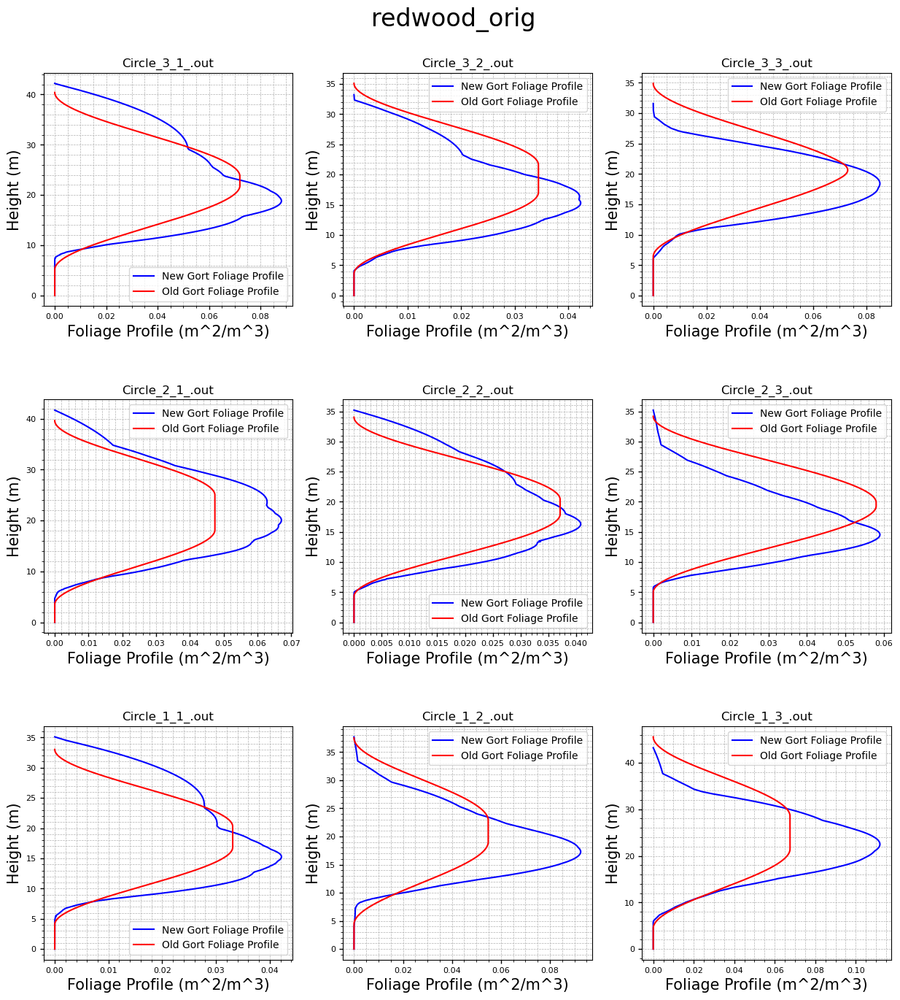

Circle_3_1_branch redwood_orig_with_branch
Circle_3_2_branch redwood_orig_with_branch
Circle_3_3_branch redwood_orig_with_branch
Circle_2_1_branch redwood_orig_with_branch
Circle_2_2_branch redwood_orig_with_branch
Circle_2_3_branch redwood_orig_with_branch
Circle_1_1_branch redwood_orig_with_branch
Circle_1_2_branch redwood_orig_with_branch
Circle_1_3_branch redwood_orig_with_branch
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/foliage_profile/redwood_orig_with_branch.pdf


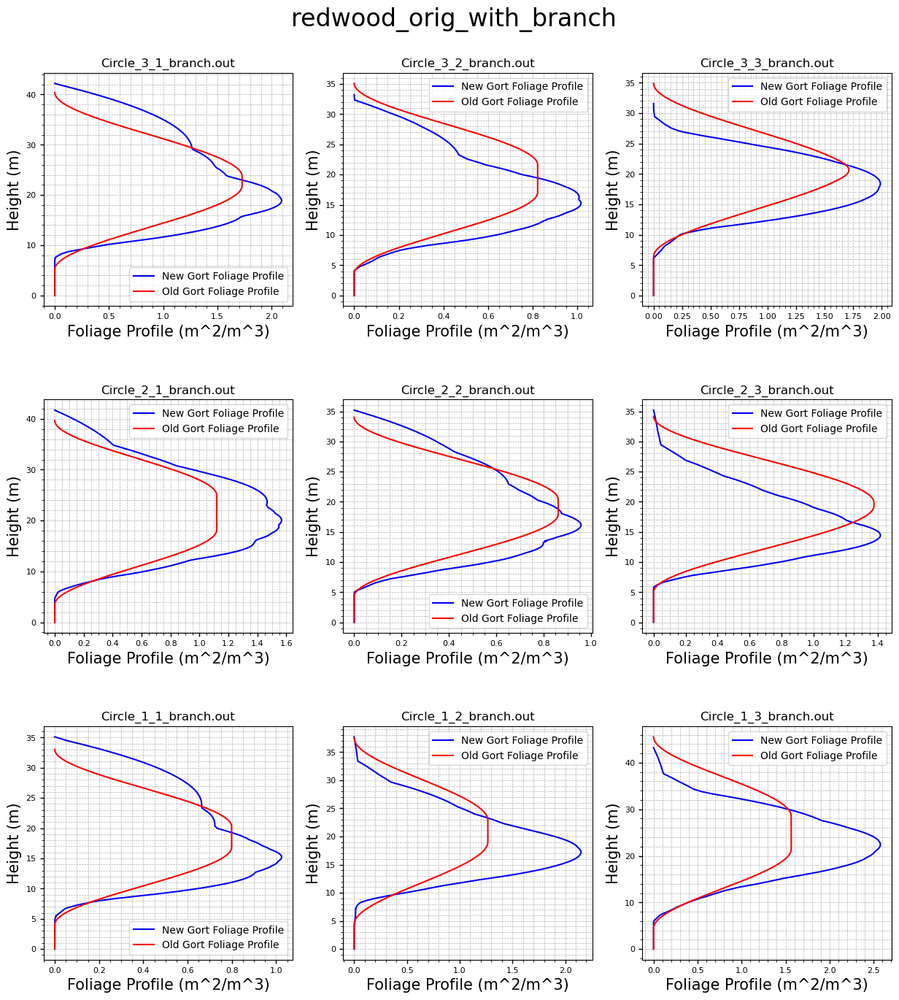

Circle_3_1_ redwood_origB10th
Circle_3_2_ redwood_origB10th
Circle_3_3_ redwood_origB10th
Circle_2_1_ redwood_origB10th
Circle_2_2_ redwood_origB10th
Circle_2_3_ redwood_origB10th
Circle_1_1_ redwood_origB10th
Circle_1_2_ redwood_origB10th
Circle_1_3_ redwood_origB10th
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/foliage_profile/redwood_origB10th.pdf


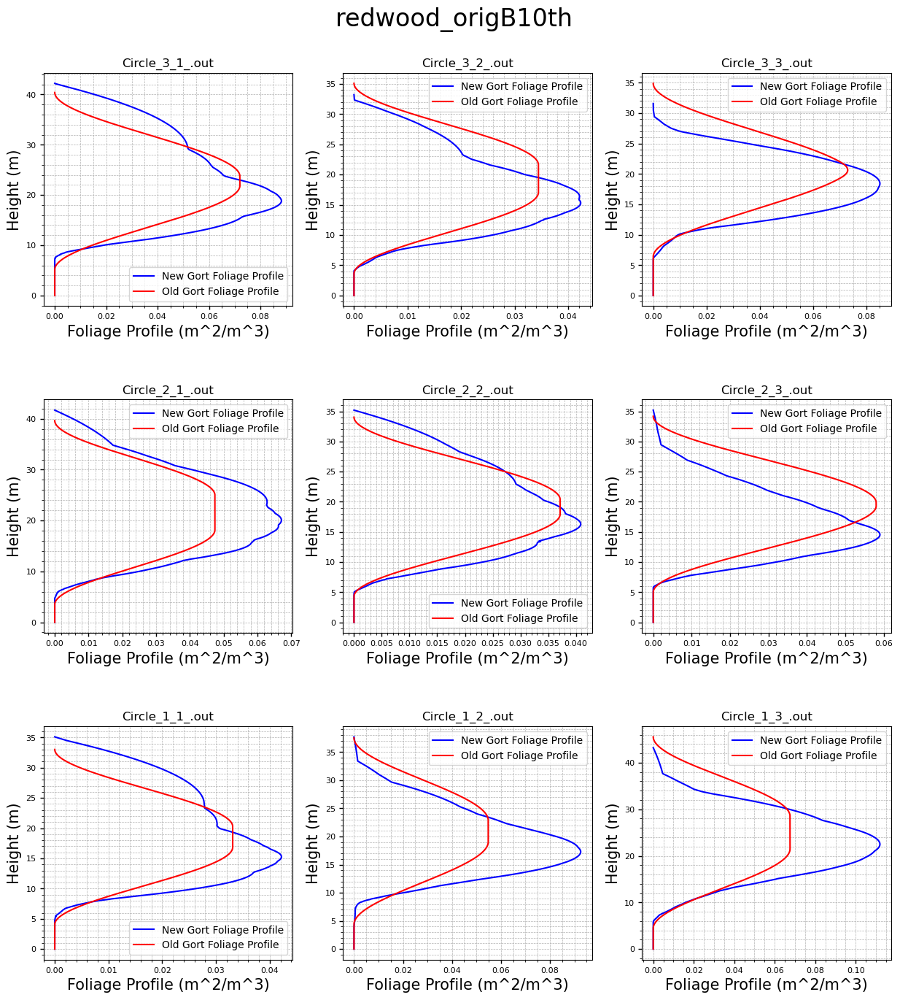

Circle_3_1_branch redwood_origB10th_with_branch
Circle_3_2_branch redwood_origB10th_with_branch
Circle_3_3_branch redwood_origB10th_with_branch
Circle_2_1_branch redwood_origB10th_with_branch
Circle_2_2_branch redwood_origB10th_with_branch
Circle_2_3_branch redwood_origB10th_with_branch
Circle_1_1_branch redwood_origB10th_with_branch
Circle_1_2_branch redwood_origB10th_with_branch
Circle_1_3_branch redwood_origB10th_with_branch
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/foliage_profile/redwood_origB10th_with_branch.pdf


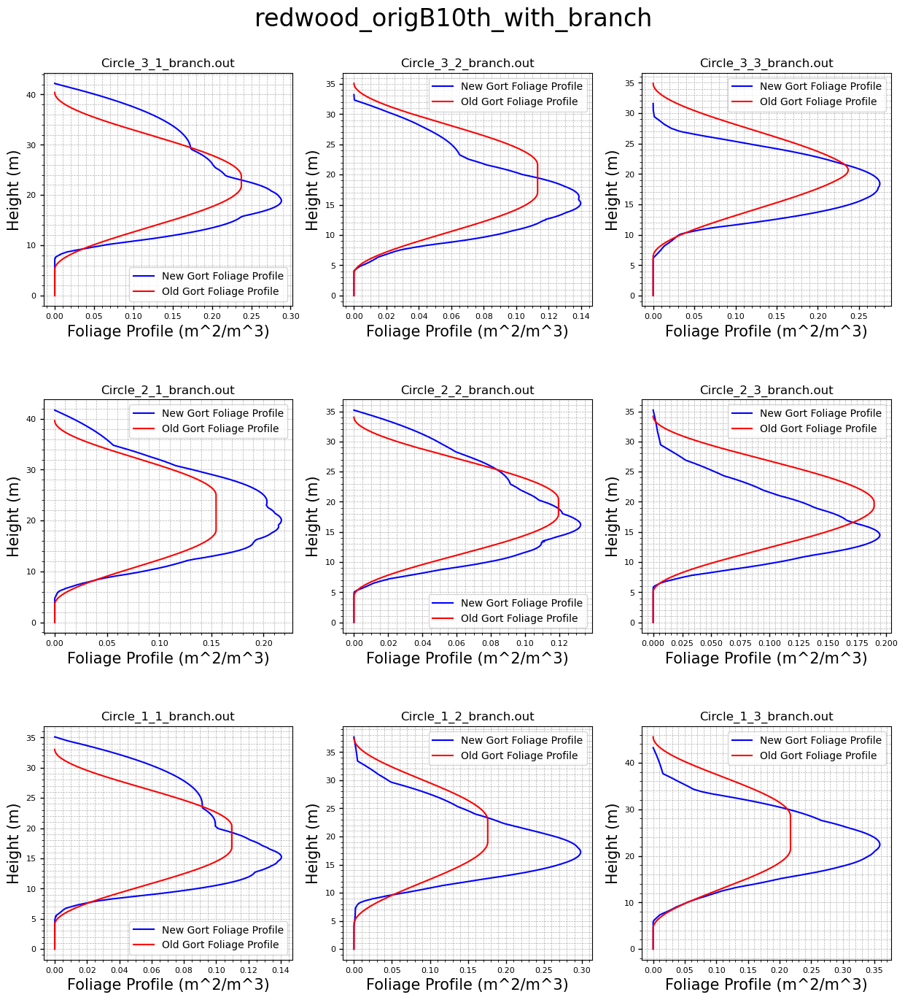

Circle_3_1_ guiana_orig
Circle_3_2_ guiana_orig
Circle_3_3_ guiana_orig
Circle_2_1_ guiana_orig
Circle_2_2_ guiana_orig
Circle_2_3_ guiana_orig
Circle_1_1_ guiana_orig
Circle_1_2_ guiana_orig
Circle_1_3_ guiana_orig
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/foliage_profile/guiana_orig.pdf


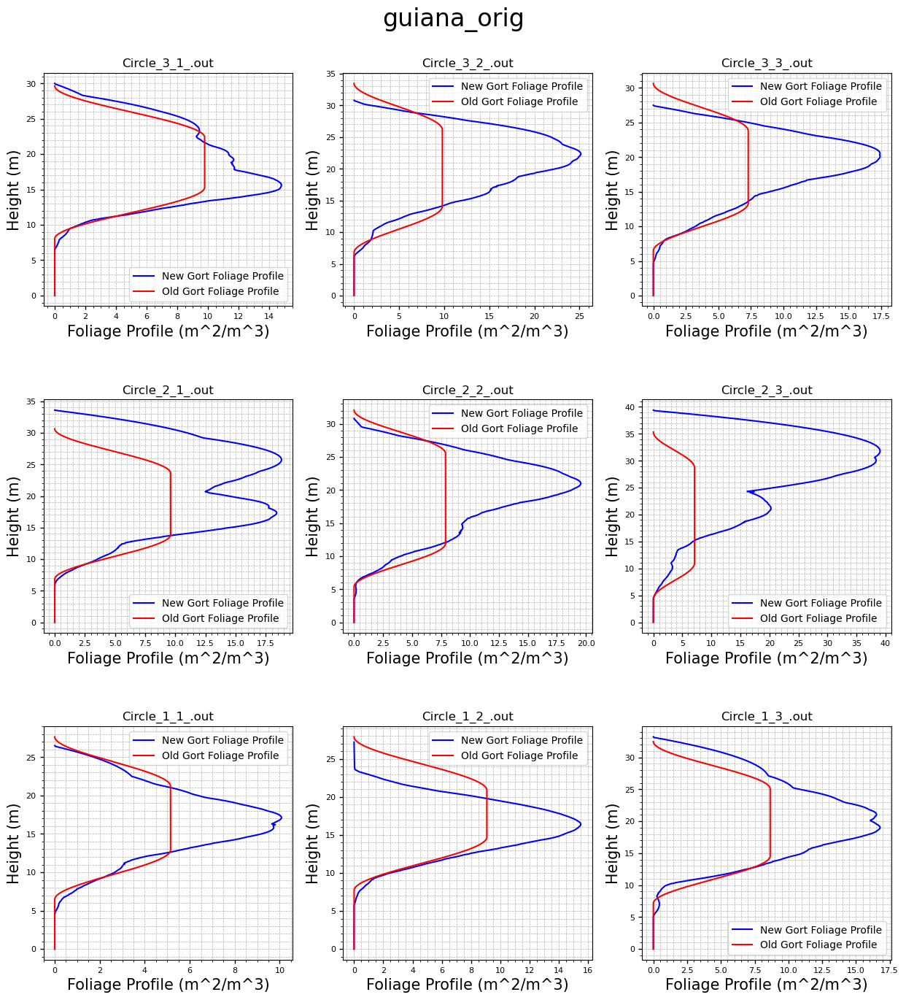

Circle_3_1_branch guiana_orig_with_branch
Circle_3_2_branch guiana_orig_with_branch
Circle_3_3_branch guiana_orig_with_branch
Circle_2_1_branch guiana_orig_with_branch
Circle_2_2_branch guiana_orig_with_branch
Circle_2_3_branch guiana_orig_with_branch
Circle_1_1_branch guiana_orig_with_branch
Circle_1_2_branch guiana_orig_with_branch
Circle_1_3_branch guiana_orig_with_branch
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/foliage_profile/guiana_orig_with_branch.pdf


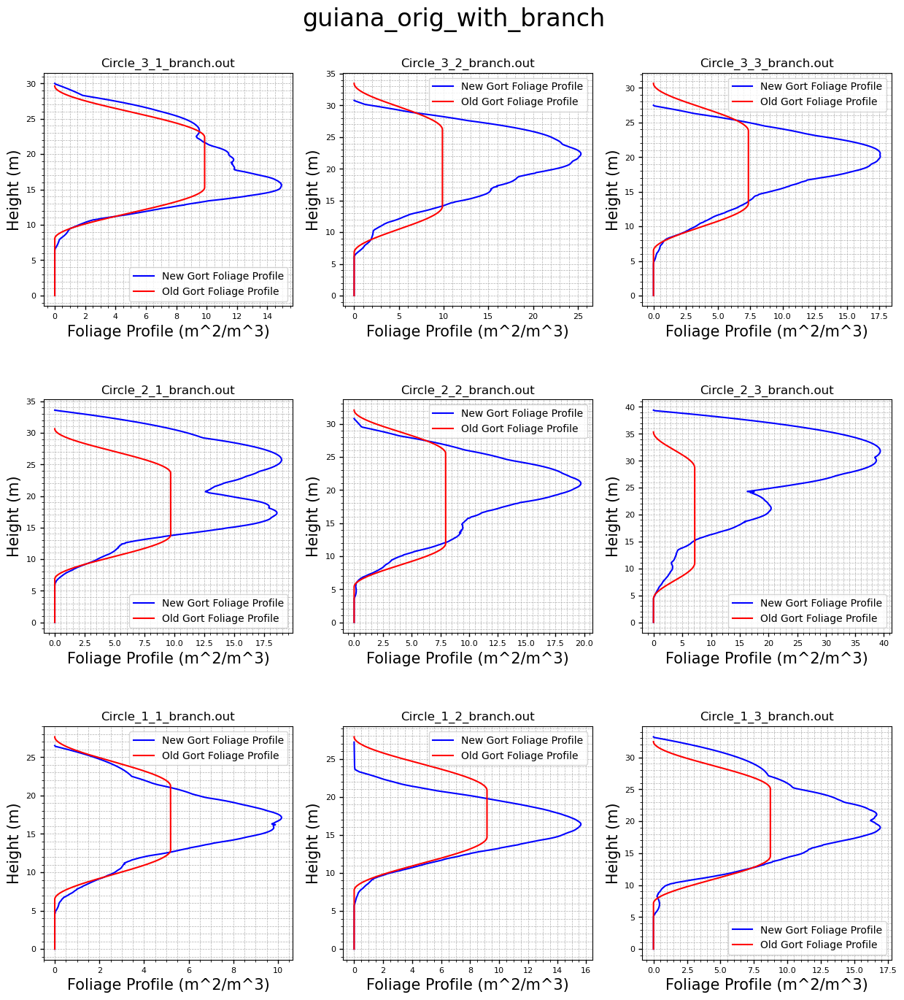

Circle_3_1_ guiana_origLD10th
Circle_3_2_ guiana_origLD10th
Circle_3_3_ guiana_origLD10th
Circle_2_1_ guiana_origLD10th
Circle_2_2_ guiana_origLD10th
Circle_2_3_ guiana_origLD10th
Circle_1_1_ guiana_origLD10th
Circle_1_2_ guiana_origLD10th
Circle_1_3_ guiana_origLD10th
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/foliage_profile/guiana_origLD10th.pdf


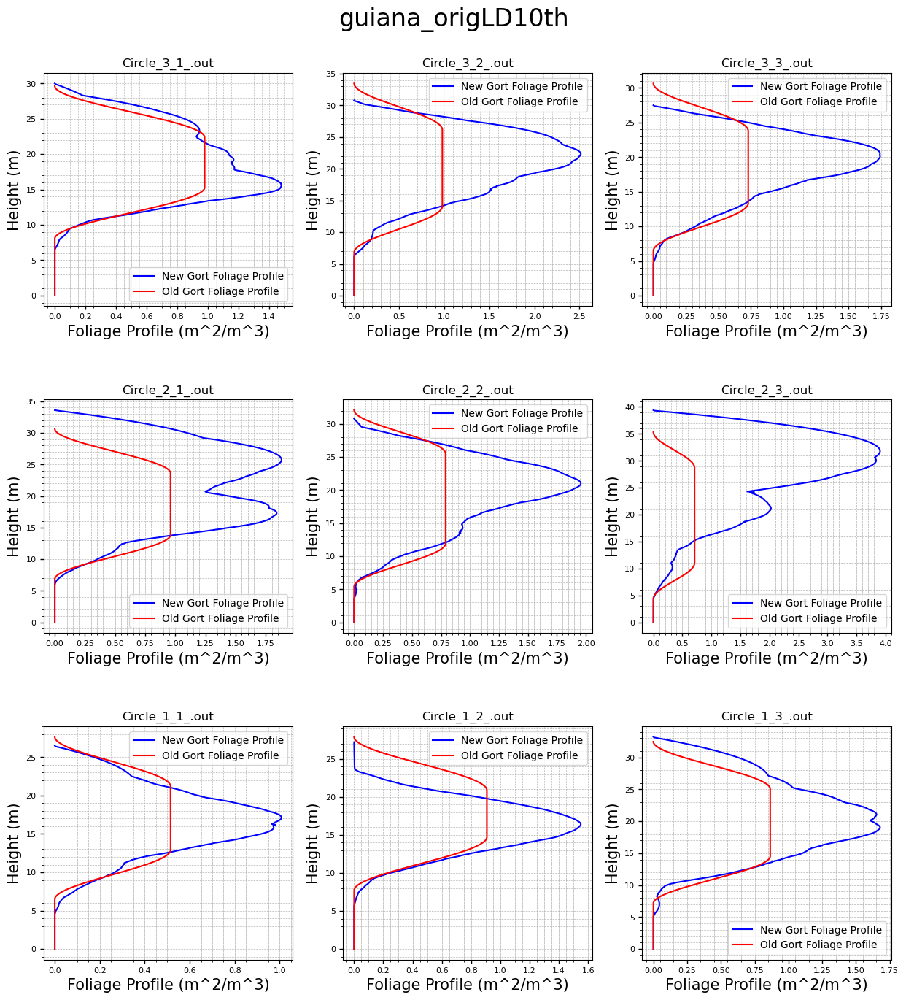

Circle_3_1_branch guiana_origLD10th_with_branch
Circle_3_2_branch guiana_origLD10th_with_branch
Circle_3_3_branch guiana_origLD10th_with_branch
Circle_2_1_branch guiana_origLD10th_with_branch
Circle_2_2_branch guiana_origLD10th_with_branch
Circle_2_3_branch guiana_origLD10th_with_branch
Circle_1_1_branch guiana_origLD10th_with_branch
Circle_1_2_branch guiana_origLD10th_with_branch
Circle_1_3_branch guiana_origLD10th_with_branch
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/foliage_profile/guiana_origLD10th_with_branch.pdf


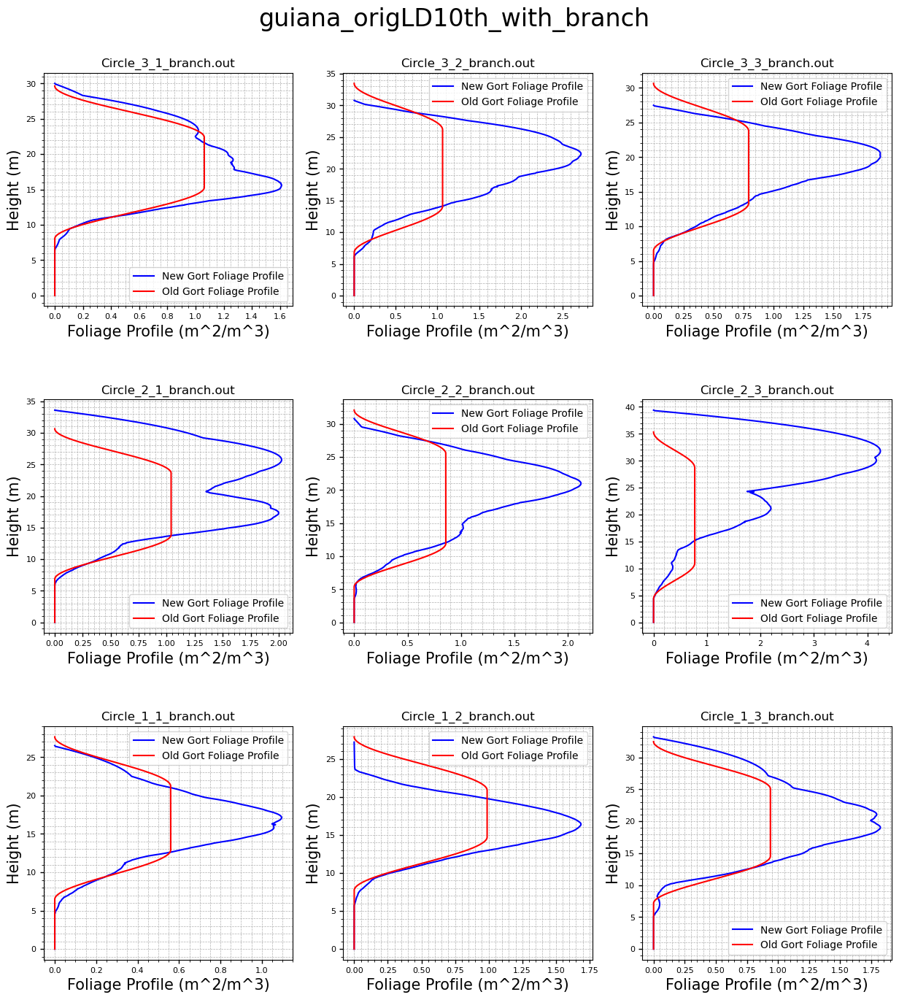

Circle_3_1_ guiana_origLD30th
Circle_3_2_ guiana_origLD30th
Circle_3_3_ guiana_origLD30th
Circle_2_1_ guiana_origLD30th
Circle_2_2_ guiana_origLD30th
Circle_2_3_ guiana_origLD30th
Circle_1_1_ guiana_origLD30th
Circle_1_2_ guiana_origLD30th
Circle_1_3_ guiana_origLD30th
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/foliage_profile/guiana_origLD30th.pdf


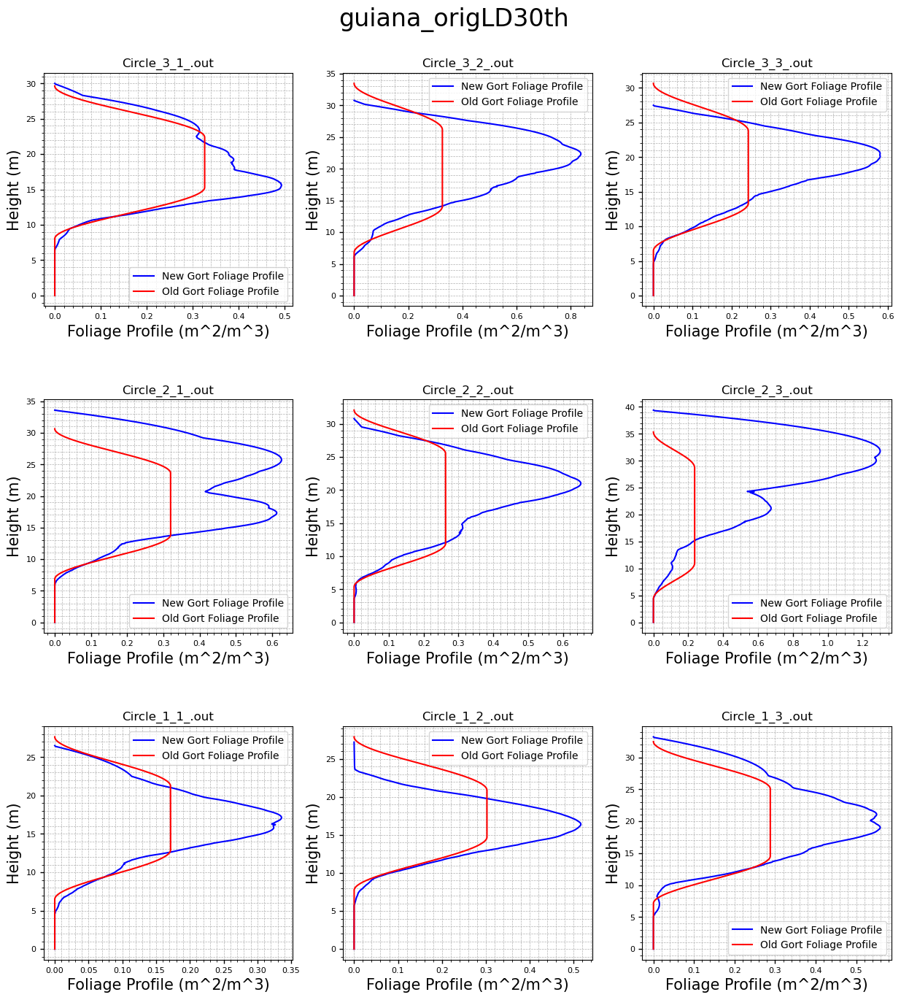

Circle_3_1_branch guiana_origLD30th_with_branch
Circle_3_2_branch guiana_origLD30th_with_branch
Circle_3_3_branch guiana_origLD30th_with_branch
Circle_2_1_branch guiana_origLD30th_with_branch
Circle_2_2_branch guiana_origLD30th_with_branch
Circle_2_3_branch guiana_origLD30th_with_branch
Circle_1_1_branch guiana_origLD30th_with_branch
Circle_1_2_branch guiana_origLD30th_with_branch
Circle_1_3_branch guiana_origLD30th_with_branch
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/foliage_profile/guiana_origLD30th_with_branch.pdf


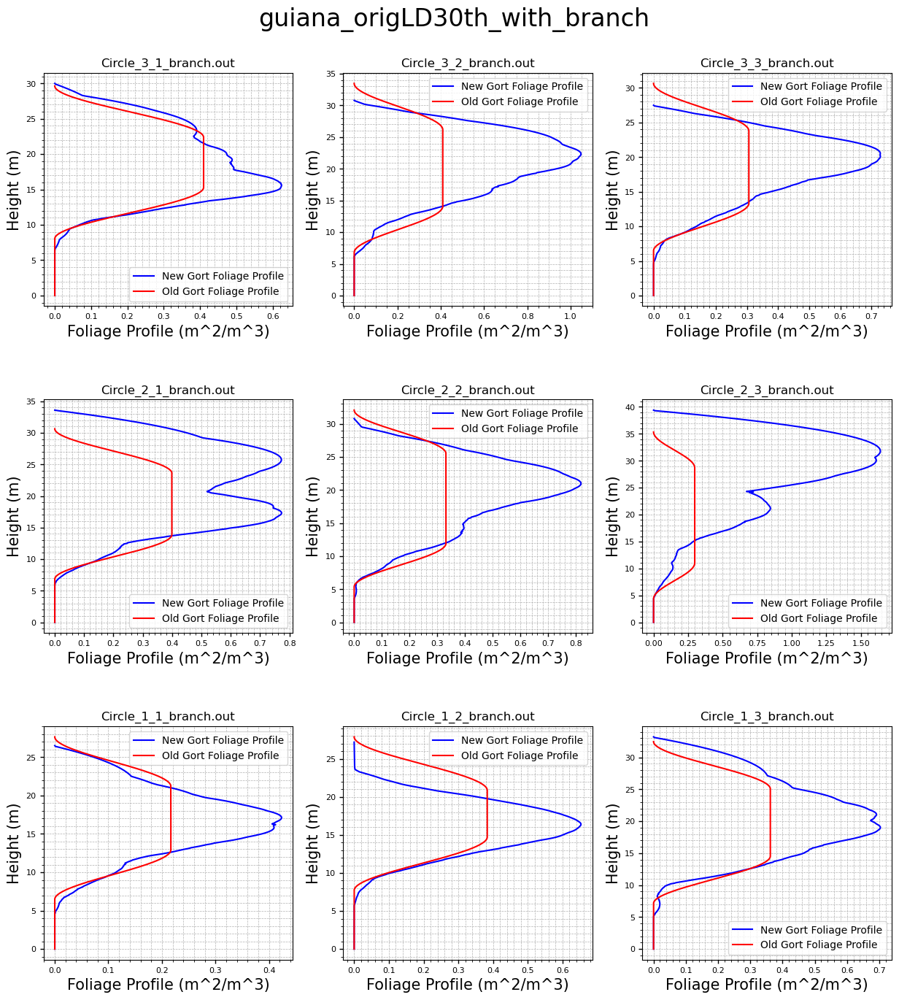

In [152]:
generate_fp_plots(LidarSim_gort_out_dir, Combined_plot_dir)

In [153]:

def return_acc_LAI_array(site_version, out_file_identifier):

    if site_version == 'guiana_orig':
        circle_objects = guiana_circle_objects_leaf_orig
        use_branch = False
    elif site_version == 'guiana_orig_with_branch':
        circle_objects = guiana_circle_objects_leaf_orig
        use_branch = True
    elif site_version == 'guiana_origLD10th':
        circle_objects = guiana_circle_objects_leaf_div10
        use_branch = False
    elif site_version == 'guiana_origLD10th_with_branch':
        circle_objects = guiana_circle_objects_leaf_div10
        use_branch = True
    elif site_version == 'guiana_origLD30th':
        circle_objects = guiana_circle_objects_leaf_div30
        use_branch = False
    elif site_version == 'guiana_origLD30th_with_branch':
        circle_objects = guiana_circle_objects_leaf_div30
        use_branch = True
    elif site_version == 'redwood_orig':
        circle_objects = redwood_circle_objects_branch_orig
        use_branch = False
    elif site_version == 'redwood_orig_with_branch':
        circle_objects = redwood_circle_objects_branch_orig
        use_branch = True
    elif site_version == 'redwood_origB10th':
        circle_objects = redwood_circle_objects_branch_origB10th
        use_branch = False
    elif site_version == 'redwood_origB10th_with_branch':
        circle_objects = redwood_circle_objects_branch_origB10th
        use_branch = True
    else:
        raise ValueError(f"Unsupported site_version: {site_version}")

    # Parse out_file_identifier to find the correct circle name
    filename = os.path.basename(out_file_identifier)
    circle_number = filename.split('_')[1:3]  # Assuming 'Circle_1_1_.out' format
    circle_name = f"Circle({circle_number[0]}, {circle_number[1]})"

    # Find the correct circle object
    for circle in circle_objects:
        if circle_name == circle.circle_name:
            height_array = circle.tree_height_array.tolist()
            if use_branch:
                return height_array, circle.acc_LAI_branch.tolist()
            else:
                return height_array, circle.acc_LAI_leaf.tolist()
            
    raise ValueError(f"{circle_name} not found in {site_version} circle objects.")


def generate_afp_plots(out_base_dir, subfolder_name):
    script_dir = os.getcwd()

    # Remove the last directory
    parent_dir = os.path.dirname(script_dir)
    
    # Parse the end part of out_base_dir as the folder name
    base_dir_name = os.path.basename(out_base_dir.strip('/'))

    # Ensure the subfolder exists in the current working directory
    save_dir = os.path.join(parent_dir, subfolder_name, base_dir_name, "acc_LAI")
    os.makedirs(save_dir, exist_ok=True)
    
    # Get all .out files in the output directory and subdirectories
    out_files = glob.glob(os.path.join(out_base_dir, '**', '*.out'), recursive=True)
    
    # Ensure we have at least 9 .out files to create a 3x3 plot
    if len(out_files) < 9:
        print("Not enough .out files found.")
        return
    
    # Group the .out files into sets of 9
    file_groups = [out_files[i:i + 9] for i in range(0, len(out_files), 9)]
    
    for group_index, file_group in enumerate(file_groups):
        fig, axes = plt.subplots(3, 3, figsize=(15, 15))
        
        # Determine the plot filename based on the subfolder names of the .out files
        rel_path = os.path.relpath(file_group[0], out_base_dir)  # Get relative path from out_base_dir
        subfolder_names = rel_path.split(os.sep)[:-1]  # Exclude last segments (filename)
        subfolder_filename = '_'.join(subfolder_names)
        
        # Remove any slashes from the subfolder_filename
        subfolder_filename = subfolder_filename.replace('/', '')
        
        # Set suptitle with enough space at the top
        fig.suptitle(subfolder_filename, y=0.98, fontsize=24)
        
        for idx, out_file in enumerate(file_group):
            row = idx // 3
            col = idx % 3
            
            # Determine the out_file identifier (e.g., Circle_1_1_)
            out_file_identifier = os.path.basename(out_file).split('.')[0]
            print(out_file_identifier, subfolder_filename)
            
            # Retrieve arrays from return_arrays function
            height_array, new_gort_acc_LAI = return_acc_LAI_array(subfolder_filename, out_file_identifier)
            print(np.max(new_gort_acc_LAI))
            
            # Reading the gort output file
            with open(out_file, 'r') as f:
                gn_level, dz = map(float, f.readline().split())
                gn_level = int(gn_level)
                
                ght = np.zeros(gn_level, dtype=np.float32)
                fp = np.zeros(gn_level, dtype=np.float32)
                new_gort_ght = np.zeros(len(new_gort_acc_LAI), dtype=np.float32)
                new_gort_fp = np.zeros(len(new_gort_acc_LAI), dtype=np.float32)

                for _ in range(3):
                    f.readline()  # skip lines

                for ilevel in range(int(gn_level)):
                    line = f.readline().strip()
                    parts = line.split()
                    parts = [float(part) for part in parts]
                    ght[ilevel] = parts[0]
                    fp[ilevel] = (parts[1]) * 2
                
                # Reverse arrays for cumulative plot
                ght = np.flipud(ght)
                fp = np.flipud(fp)

                cumulative_fp = np.cumsum(fp) * dz
                
                for new_gort_ilevel in range(len(new_gort_fp)):
                    new_gort_ght[new_gort_ilevel] = height_array[new_gort_ilevel]
                    new_gort_fp[new_gort_ilevel] = new_gort_acc_LAI[new_gort_ilevel]
                # print(gn_level, len(new_gort_waveform), len(wvfm))
                
                print(np.max(new_gort_fp))

                axes[row, col].plot(new_gort_fp, new_gort_ght, label='New Gort Accumulated LAI', color='blue')
                axes[row, col].plot(cumulative_fp, ght, label='Old Gort afp', color='red')
                axes[row, col].set_title(f"{os.path.basename(out_file)}")
                axes[row, col].set_xlabel('Accumulated LAI (m^2/m^3)', fontsize=15)
                axes[row, col].set_ylabel('Height (m)', fontsize=15)
                axes[row, col].grid(True, which='both', linestyle='--', linewidth=0.5)
                axes[row, col].minorticks_on()
                axes[row, col].tick_params(labelsize=8, width=1)
                
                # Add legend to the subplot
                axes[row, col].legend()
                
        # Adjust layout and save the plot
        fig.subplots_adjust(top=0.92, hspace=0.4)
        
        plot_filename_pdf = os.path.join(save_dir, f"{subfolder_filename}.pdf")
        plot_filename_png = os.path.join(save_dir, f"{subfolder_filename}.png")
        print(plot_filename_pdf)
        
        plt.savefig(plot_filename_pdf)
        plt.savefig(plot_filename_png)
        plt.show()
        plt.close(fig)  # Close the figure to release memory

Circle_3_1_ redwood_orig
1.7399374560081207
1.7399374
Circle_3_2_ redwood_orig
0.6242066010079999
0.6242066
Circle_3_3_ redwood_orig
1.0105238723303096
1.0105239
Circle_2_1_ redwood_orig
1.3599123638445316
1.3599124
Circle_2_2_ redwood_orig
0.7034572970699897
0.7034573
Circle_2_3_ redwood_orig
0.7314314484849989
0.7314314
Circle_1_1_ redwood_orig
0.7321200200908133
0.73212004
Circle_1_2_ redwood_orig
1.22645084304721
1.2264508
Circle_1_3_ redwood_orig
1.8631743557489235
1.8631743
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/acc_LAI/redwood_orig.pdf


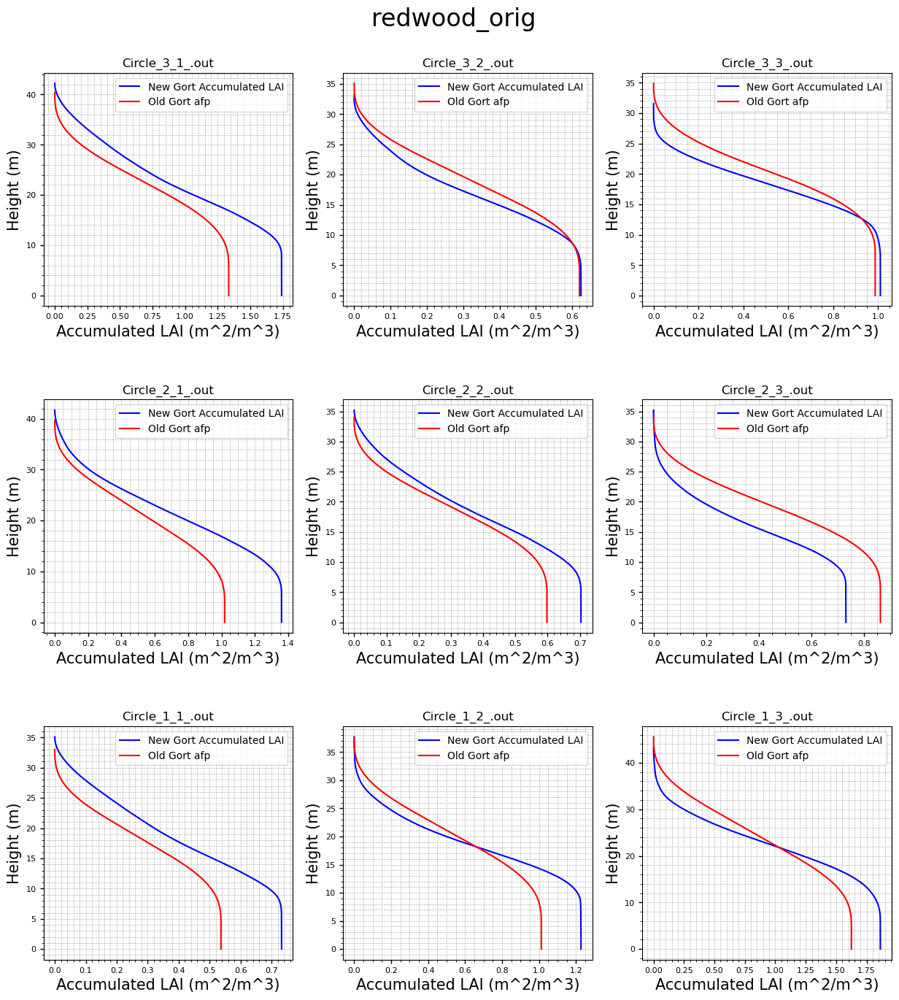

Circle_3_1_branch redwood_orig_with_branch
41.72494058732556
41.72494
Circle_3_2_branch redwood_orig_with_branch
14.907076040681037
14.907076
Circle_3_3_branch redwood_orig_with_branch
23.694800743445597
23.694801
Circle_2_1_branch redwood_orig_with_branch
32.08443837039837
32.08444
Circle_2_2_branch redwood_orig_with_branch
16.30366886353859
16.303669
Circle_2_3_branch redwood_orig_with_branch
17.351747399777576
17.351748
Circle_1_1_branch redwood_orig_with_branch
17.662618934184128
17.662619
Circle_1_2_branch redwood_orig_with_branch
28.35211283819085
28.352114
Circle_1_3_branch redwood_orig_with_branch
43.14530144517723
43.1453
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/acc_LAI/redwood_orig_with_branch.pdf


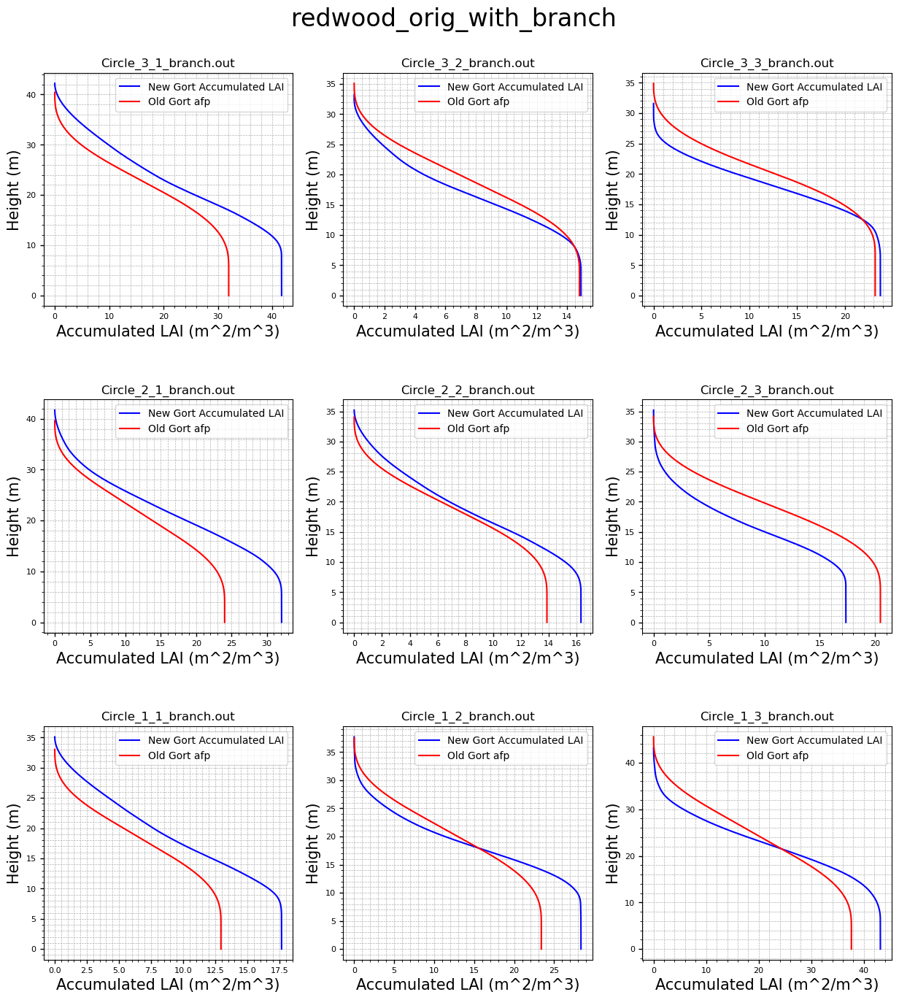

Circle_3_1_ redwood_origB10th
1.7399374560081207
1.7399374
Circle_3_2_ redwood_origB10th
0.6242066010079999
0.6242066
Circle_3_3_ redwood_origB10th
1.0105238723303096
1.0105239
Circle_2_1_ redwood_origB10th
1.3599123638445316
1.3599124
Circle_2_2_ redwood_origB10th
0.7034572970699897
0.7034573
Circle_2_3_ redwood_origB10th
0.7314314484849989
0.7314314
Circle_1_1_ redwood_origB10th
0.7321200200908133
0.73212004
Circle_1_2_ redwood_origB10th
1.22645084304721
1.2264508
Circle_1_3_ redwood_origB10th
1.8631743557489235
1.8631743
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/acc_LAI/redwood_origB10th.pdf


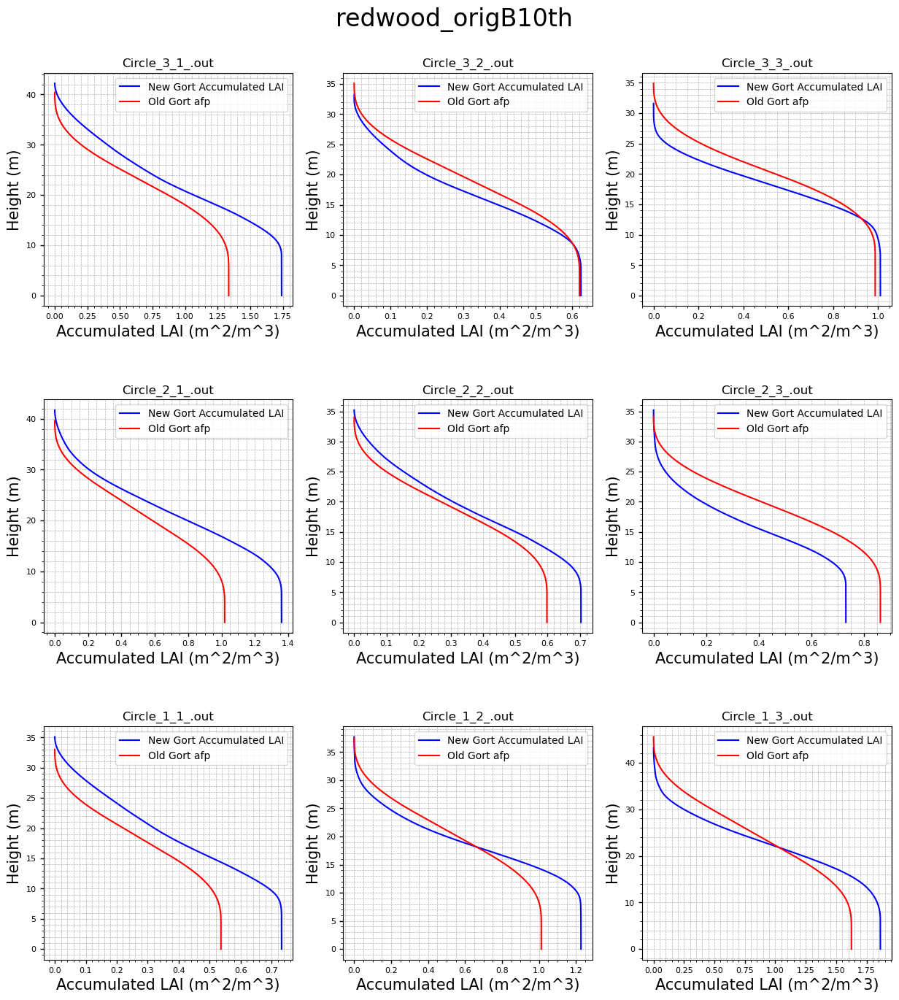

Circle_3_1_branch redwood_origB10th_with_branch
5.73843776913986
5.7384377
Circle_3_2_branch redwood_origB10th_with_branch
2.0524935449753046
2.0524936
Circle_3_3_branch redwood_origB10th_with_branch
3.2789515594418384
3.2789516
Circle_2_1_branch redwood_origB10th_with_branch
4.4323649644999215
4.432365
Circle_2_2_branch redwood_origB10th_with_branch
2.26347845371685
2.2634785
Circle_2_3_branch redwood_origB10th_with_branch
2.393463043614256
2.3934631
Circle_1_1_branch redwood_origB10th_with_branch
2.425169911500147
2.42517
Circle_1_2_branch redwood_origB10th_with_branch
3.9390170425615754
3.939017
Circle_1_3_branch redwood_origB10th_with_branch
5.9913870646917475
5.991387
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/acc_LAI/redwood_origB10th_with_branch.pdf


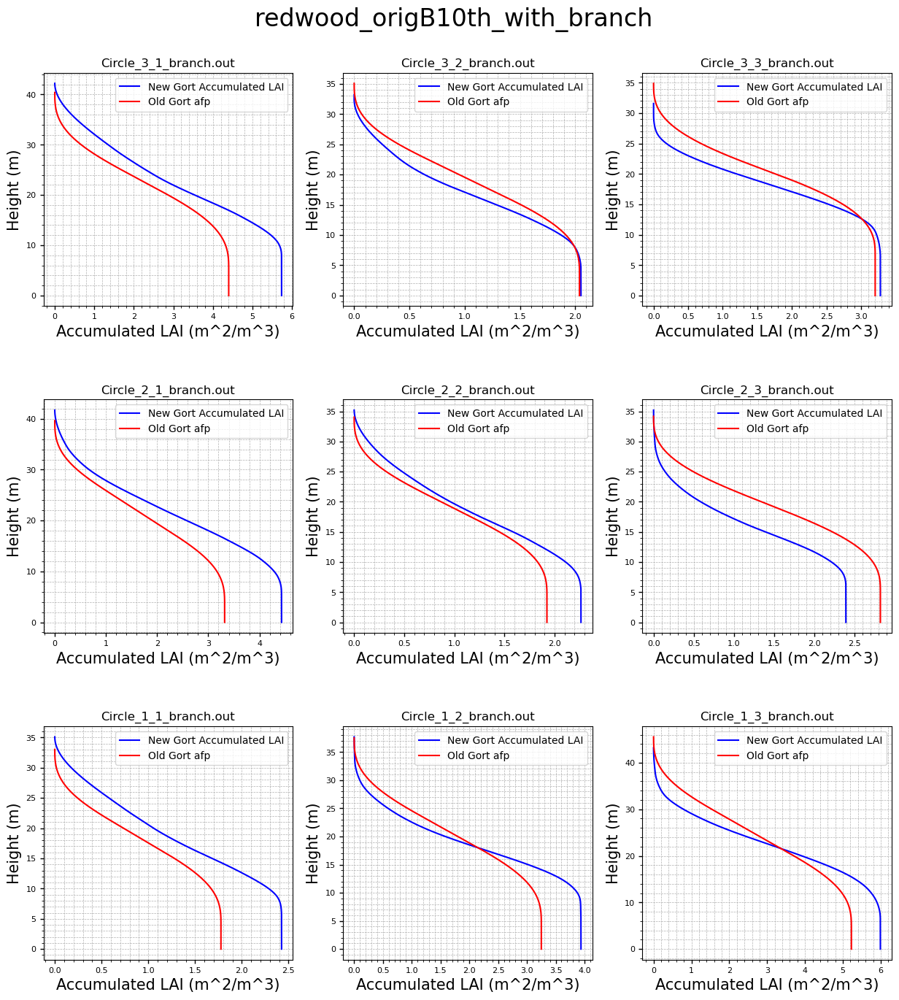

Circle_3_1_ guiana_orig
174.09554826998442
174.09555
Circle_3_2_ guiana_orig
303.11408773709434
303.11407
Circle_3_3_ guiana_orig
181.78301913955832
181.78302
Circle_2_1_ guiana_orig
306.3487166211275
306.34872
Circle_2_2_ guiana_orig
230.92176533681913
230.92177
Circle_2_3_ guiana_orig
615.3704950225002
615.3705
Circle_1_1_ guiana_orig
96.83693284050446
96.83693
Circle_1_2_ guiana_orig
123.60892183575086
123.608925
Circle_1_3_ guiana_orig
233.653811718259
233.65381
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/acc_LAI/guiana_orig.pdf


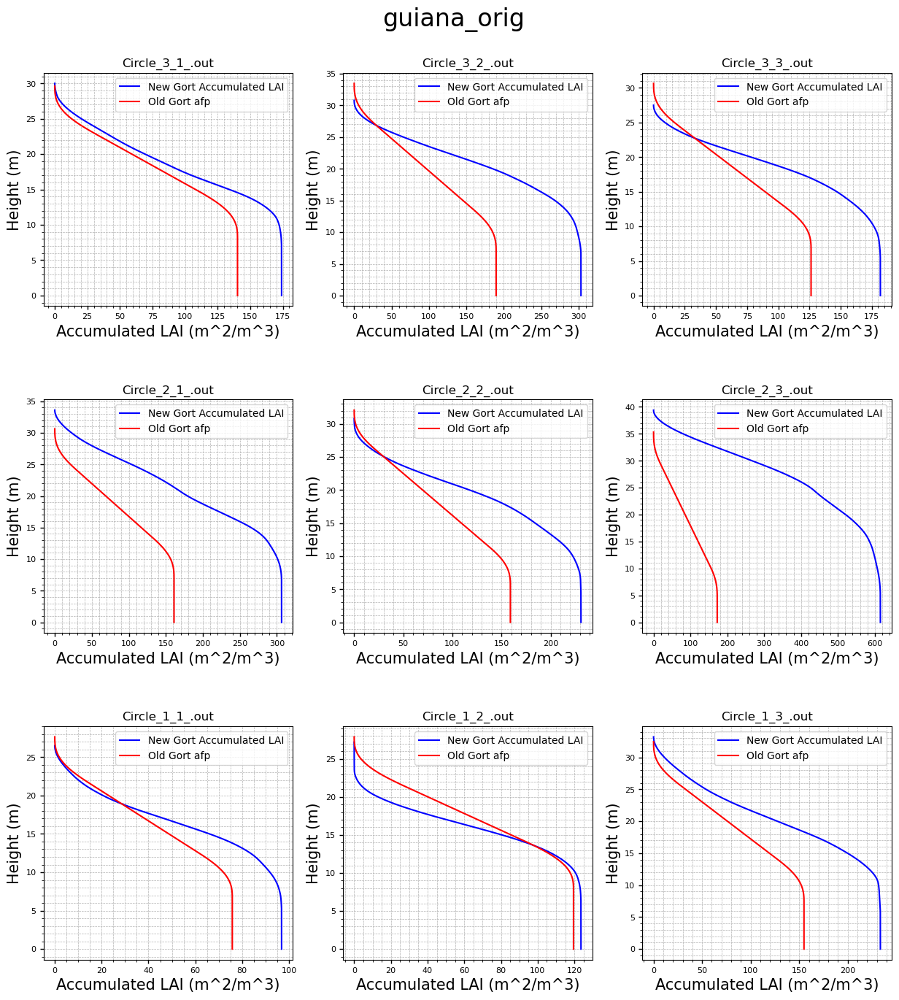

Circle_3_1_branch guiana_orig_with_branch
175.58723024219478
175.58723
Circle_3_2_branch guiana_orig_with_branch
305.69247757008793
305.69247
Circle_3_3_branch guiana_orig_with_branch
183.35947032192595
183.35947
Circle_2_1_branch guiana_orig_with_branch
308.87366173293776
308.87366
Circle_2_2_branch guiana_orig_with_branch
232.91030699551507
232.91031
Circle_2_3_branch guiana_orig_with_branch
620.6756928435223
620.6757
Circle_1_1_branch guiana_orig_with_branch
97.6864181404869
97.68642
Circle_1_2_branch guiana_orig_with_branch
124.70655127917556
124.70655
Circle_1_3_branch guiana_orig_with_branch
235.65186366465474
235.65187
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/acc_LAI/guiana_orig_with_branch.pdf


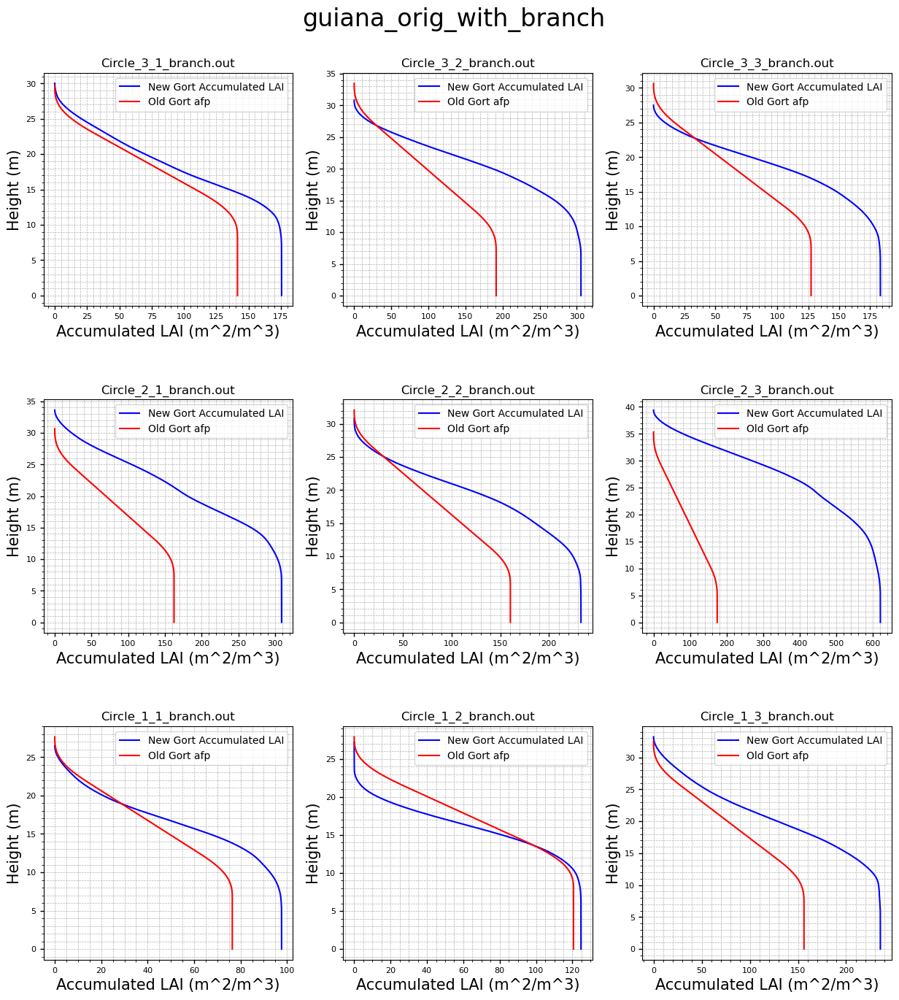

Circle_3_1_ guiana_origLD10th
17.40955482699843
17.409555
Circle_3_2_ guiana_origLD10th
30.311408773709417
30.311409
Circle_3_3_ guiana_origLD10th
18.178301913955842
18.178303
Circle_2_1_ guiana_origLD10th
30.634871662112722
30.634872
Circle_2_2_ guiana_origLD10th
23.092176533681904
23.092176
Circle_2_3_ guiana_origLD10th
61.53704950225003
61.53705
Circle_1_1_ guiana_origLD10th
9.683693284050452
9.683693
Circle_1_2_ guiana_origLD10th
12.360892183575096
12.360892
Circle_1_3_ guiana_origLD10th
23.365381171825916
23.365381
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/acc_LAI/guiana_origLD10th.pdf


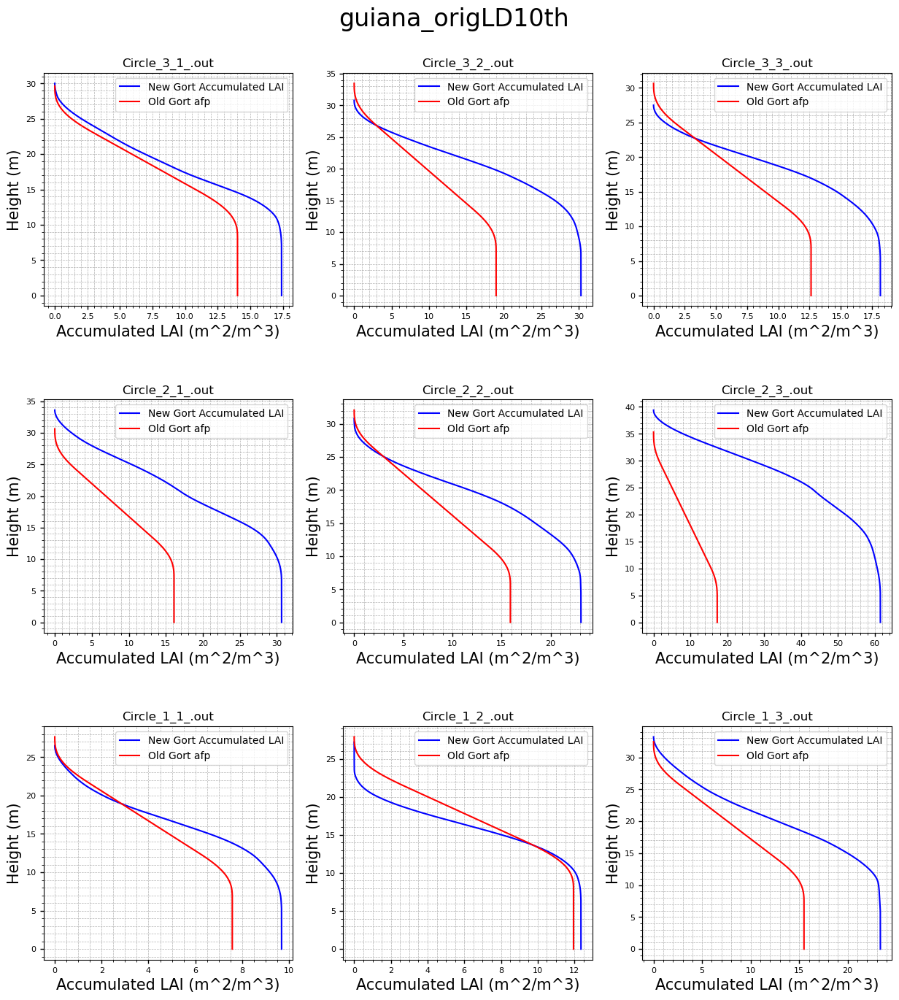

Circle_3_1_branch guiana_origLD10th_with_branch
18.90123679920884
18.901237
Circle_3_2_branch guiana_origLD10th_with_branch
32.88979860670297
32.889797
Circle_3_3_branch guiana_origLD10th_with_branch
19.754753096323473
19.754753
Circle_2_1_branch guiana_origLD10th_with_branch
33.15981677392326
33.159817
Circle_2_2_branch guiana_origLD10th_with_branch
25.080718192377777
25.080719
Circle_2_3_branch guiana_origLD10th_with_branch
66.84224732327168
66.84225
Circle_1_1_branch guiana_origLD10th_with_branch
10.533178584032916
10.533178
Circle_1_2_branch guiana_origLD10th_with_branch
13.458521626999783
13.458522
Circle_1_3_branch guiana_origLD10th_with_branch
25.363433118221252
25.363434
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/acc_LAI/guiana_origLD10th_with_branch.pdf


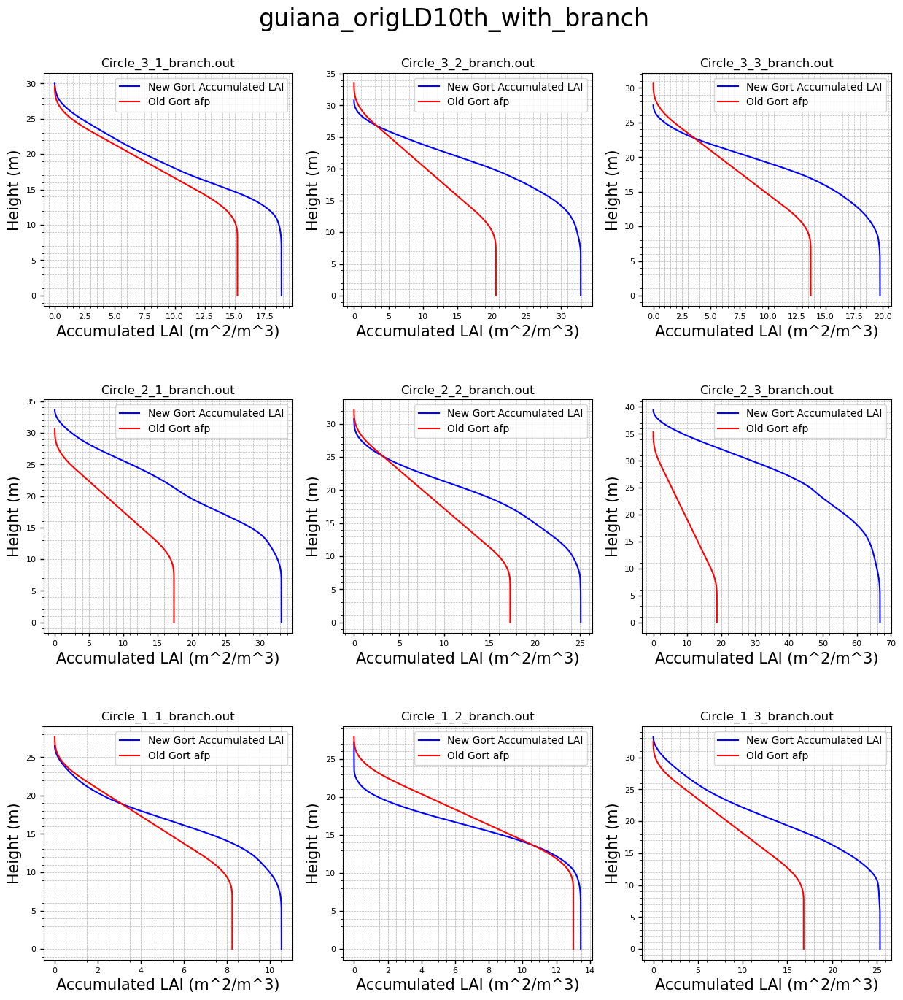

Circle_3_1_ guiana_origLD30th
5.799868836651477
5.799869
Circle_3_2_ guiana_origLD30th
10.098029322898624
10.098029
Circle_3_3_ guiana_origLD30th
6.055971437620722
6.0559716
Circle_2_1_ guiana_origLD30th
10.205788673720978
10.205789
Circle_2_2_ guiana_origLD30th
7.692993668078031
7.6929936
Circle_2_3_ guiana_origLD30th
20.500628491321002
20.50063
Circle_1_1_ guiana_origLD30th
3.226053248343663
3.2260532
Circle_1_2_ guiana_origLD30th
4.117942938871011
4.117943
Circle_1_3_ guiana_origLD30th
7.784009841814012
7.78401
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/acc_LAI/guiana_origLD30th.pdf


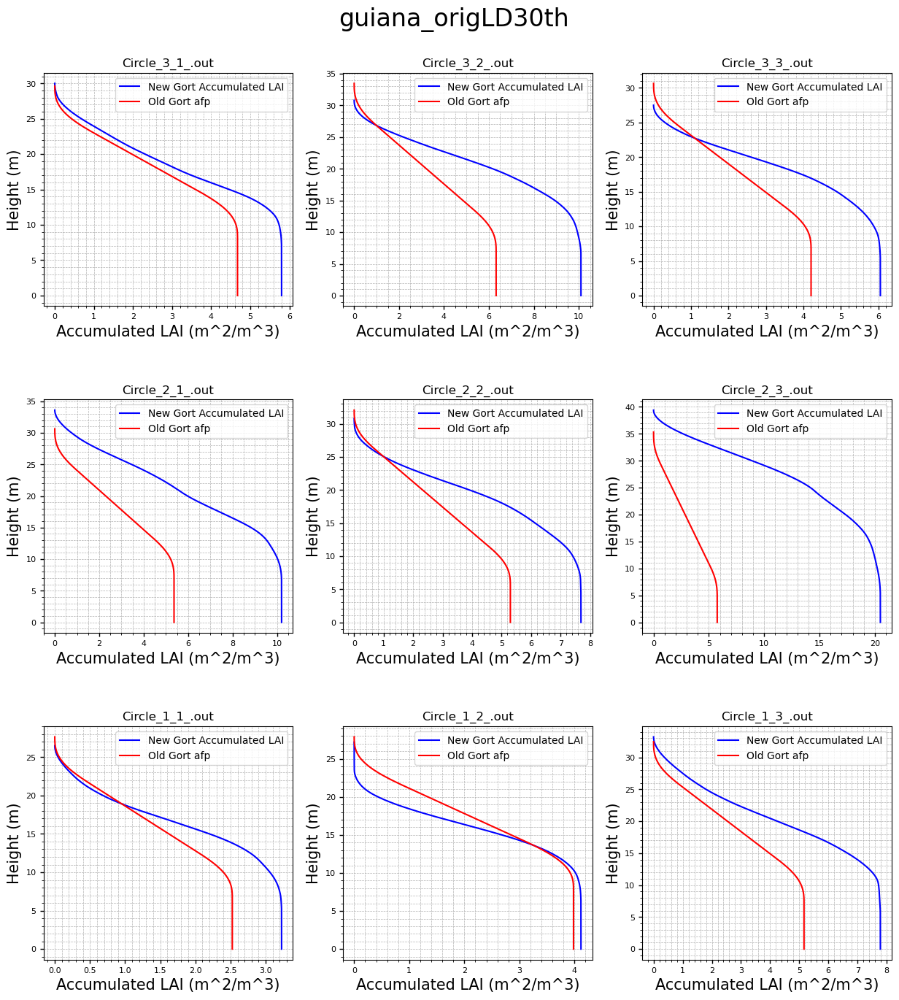

Circle_3_1_branch guiana_origLD30th_with_branch
7.2915508088618886
7.2915506
Circle_3_2_branch guiana_origLD30th_with_branch
12.676419155892177
12.676419
Circle_3_3_branch guiana_origLD30th_with_branch
7.632422619988367
7.6324224
Circle_2_1_branch guiana_origLD30th_with_branch
12.730733785531529
12.730734
Circle_2_2_branch guiana_origLD30th_with_branch
9.681535326773902
9.681536
Circle_2_3_branch guiana_origLD30th_with_branch
25.805826312342653
25.805826
Circle_1_1_branch guiana_origLD30th_with_branch
4.075538548326131
4.0755386
Circle_1_2_branch guiana_origLD30th_with_branch
5.215572382295708
5.2155724
Circle_1_3_branch guiana_origLD30th_with_branch
9.782061788209337
9.782062
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/acc_LAI/guiana_origLD30th_with_branch.pdf


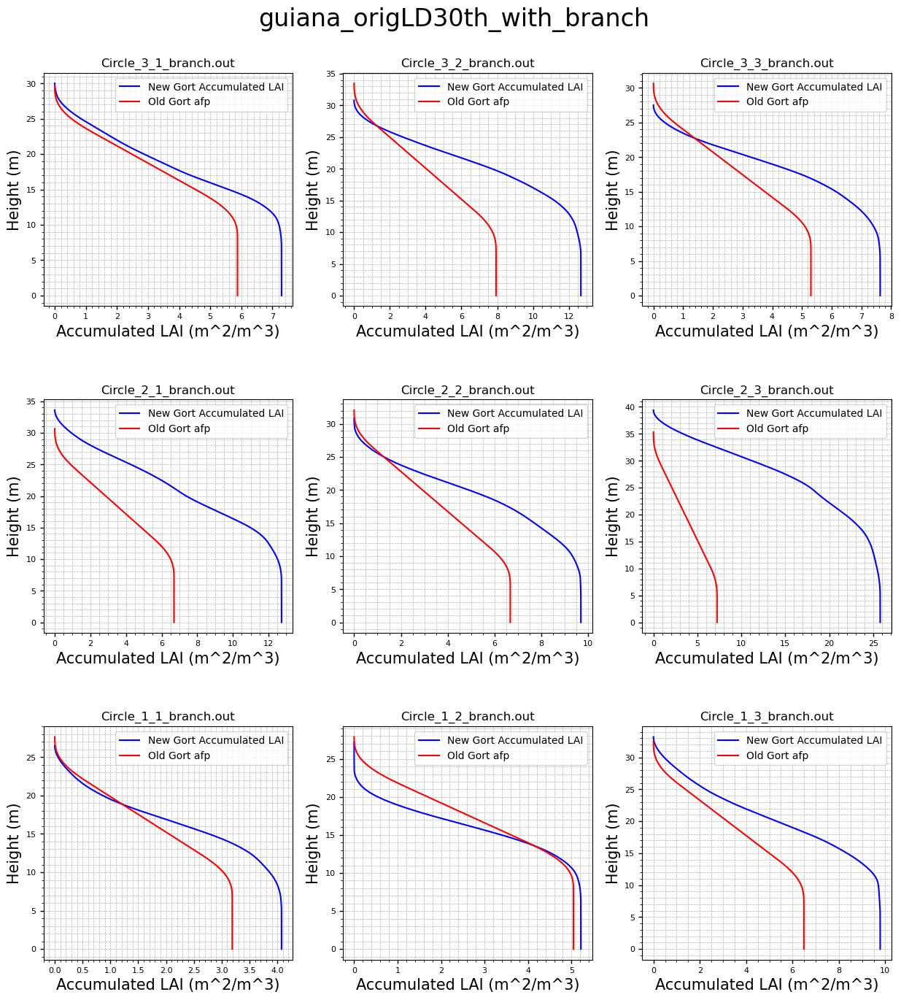

In [154]:
generate_afp_plots(LidarSim_gort_out_dir, Combined_plot_dir)

In [155]:

def return_pgap_array(site_version, out_file_identifier):

    if site_version == 'guiana_orig':
        circle_objects = guiana_circle_objects_leaf_orig
        use_branch = False
    elif site_version == 'guiana_orig_with_branch':
        circle_objects = guiana_circle_objects_leaf_orig
        use_branch = True
    elif site_version == 'guiana_origLD10th':
        circle_objects = guiana_circle_objects_leaf_div10
        use_branch = False
    elif site_version == 'guiana_origLD10th_with_branch':
        circle_objects = guiana_circle_objects_leaf_div10
        use_branch = True
    elif site_version == 'guiana_origLD30th':
        circle_objects = guiana_circle_objects_leaf_div30
        use_branch = False
    elif site_version == 'guiana_origLD30th_with_branch':
        circle_objects = guiana_circle_objects_leaf_div30
        use_branch = True
    elif site_version == 'redwood_orig':
        circle_objects = redwood_circle_objects_branch_orig
        use_branch = False
    elif site_version == 'redwood_orig_with_branch':
        circle_objects = redwood_circle_objects_branch_orig
        use_branch = True
    elif site_version == 'redwood_origB10th':
        circle_objects = redwood_circle_objects_branch_origB10th
        use_branch = False
    elif site_version == 'redwood_origB10th_with_branch':
        circle_objects = redwood_circle_objects_branch_origB10th
        use_branch = True
    else:
        raise ValueError(f"Unsupported site_version: {site_version}")

    # Parse out_file_identifier to find the correct circle name
    filename = os.path.basename(out_file_identifier)
    circle_number = filename.split('_')[1:3]  # Assuming 'Circle_1_1_.out' format
    circle_name = f"Circle({circle_number[0]}, {circle_number[1]})"

    # Find the correct circle object
    for circle in circle_objects:
        if circle_name == circle.circle_name:
            height_array = circle.tree_height_array.tolist()
            if use_branch:
                return height_array, circle.gap_prob_b.tolist()
            else:
                return height_array, circle.gap_prob.tolist()
            
    raise ValueError(f"{circle_name} not found in {site_version} circle objects.")


def generate_pgap_plots(out_base_dir, subfolder_name):
    script_dir = os.getcwd()
    
    # Remove the last subdirectory
    parent_dir = os.path.dirname(script_dir)
    
    # Parse the end part of out_base_dir as the folder name
    base_dir_name = os.path.basename(out_base_dir.strip('/'))

    # Ensure the subfolder exists in the current working directory
    save_dir = os.path.join(parent_dir, subfolder_name, base_dir_name, "gap_probability")
    os.makedirs(save_dir, exist_ok=True)
    
    # Get all .out files in the output directory and subdirectories
    out_files = glob.glob(os.path.join(out_base_dir, '**', '*.out'), recursive=True)
    
    # Ensure we have at least 9 .out files to create a 3x3 plot
    if len(out_files) < 9:
        print("Not enough .out files found.")
        return
    
    # Group the .out files into sets of 9
    file_groups = [out_files[i:i + 9] for i in range(0, len(out_files), 9)]
    
    for group_index, file_group in enumerate(file_groups):
        fig, axes = plt.subplots(3, 3, figsize=(15, 15))
        
        # Determine the plot filename based on the subfolder names of the .out files
        rel_path = os.path.relpath(file_group[0], out_base_dir)  # Get relative path from out_base_dir
        subfolder_names = rel_path.split(os.sep)[:-1]  # Exclude last segments (filename)
        subfolder_filename = '_'.join(subfolder_names)
        
        # Remove any slashes from the subfolder_filename
        subfolder_filename = subfolder_filename.replace('/', '')
        
        # Set suptitle with enough space at the top
        fig.suptitle(subfolder_filename, y=0.98, fontsize=24)
        
        for idx, out_file in enumerate(file_group):
            row = idx // 3
            col = idx % 3
            
            # Determine the out_file identifier (e.g., Circle_1_1_)
            out_file_identifier = os.path.basename(out_file).split('.')[0]
            print(out_file_identifier, subfolder_filename)
            
            # Retrieve arrays from return_arrays function
            height_array, new_gort_pgap = return_pgap_array(subfolder_filename, out_file_identifier)
            
            # Reading the gort output file
            with open(out_file, 'r') as f:
                gn_level, dz = map(float, f.readline().split())
                gn_level = int(gn_level)
                
                ght = np.zeros(gn_level, dtype=np.float32)
                pgap = np.zeros(gn_level, dtype=np.float32)

                for _ in range(3):
                    f.readline()  # skip lines

                for ilevel in range(int(gn_level)):
                    line = f.readline().strip()
                    parts = line.split()
                    parts = [float(part) for part in parts]
                    ght[ilevel] = parts[0]
                    pgap[ilevel] = parts[3]

                axes[row, col].plot(new_gort_pgap, height_array, label='New Gort Gap Probability', color='blue')
                axes[row, col].plot(pgap, ght, label='Old Gort pgap', color='red')
                axes[row, col].set_title(f"{os.path.basename(out_file)}")
                axes[row, col].set_xlabel('Canopy Gap Probability', fontsize=15)
                axes[row, col].set_ylabel('Height (m)', fontsize=15)
                axes[row, col].grid(True, which='both', linestyle='--', linewidth=0.5)
                axes[row, col].minorticks_on()
                axes[row, col].tick_params(labelsize=8, width=1)
                
                # Add legend to the subplot
                axes[row, col].legend()
                
        # Adjust layout and save the plot
        fig.subplots_adjust(top=0.92, hspace=0.4)
        
        plot_filename_pdf = os.path.join(save_dir, f"{subfolder_filename}.pdf")
        plot_filename_png = os.path.join(save_dir, f"{subfolder_filename}.png")
        print(plot_filename_pdf)
        
        plt.savefig(plot_filename_pdf)
        plt.savefig(plot_filename_png)
        plt.show()
        plt.close(fig)  # Close the figure to release memory

Circle_3_1_ redwood_orig
Circle_3_2_ redwood_orig
Circle_3_3_ redwood_orig
Circle_2_1_ redwood_orig
Circle_2_2_ redwood_orig
Circle_2_3_ redwood_orig
Circle_1_1_ redwood_orig
Circle_1_2_ redwood_orig
Circle_1_3_ redwood_orig
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/gap_probability/redwood_orig.pdf


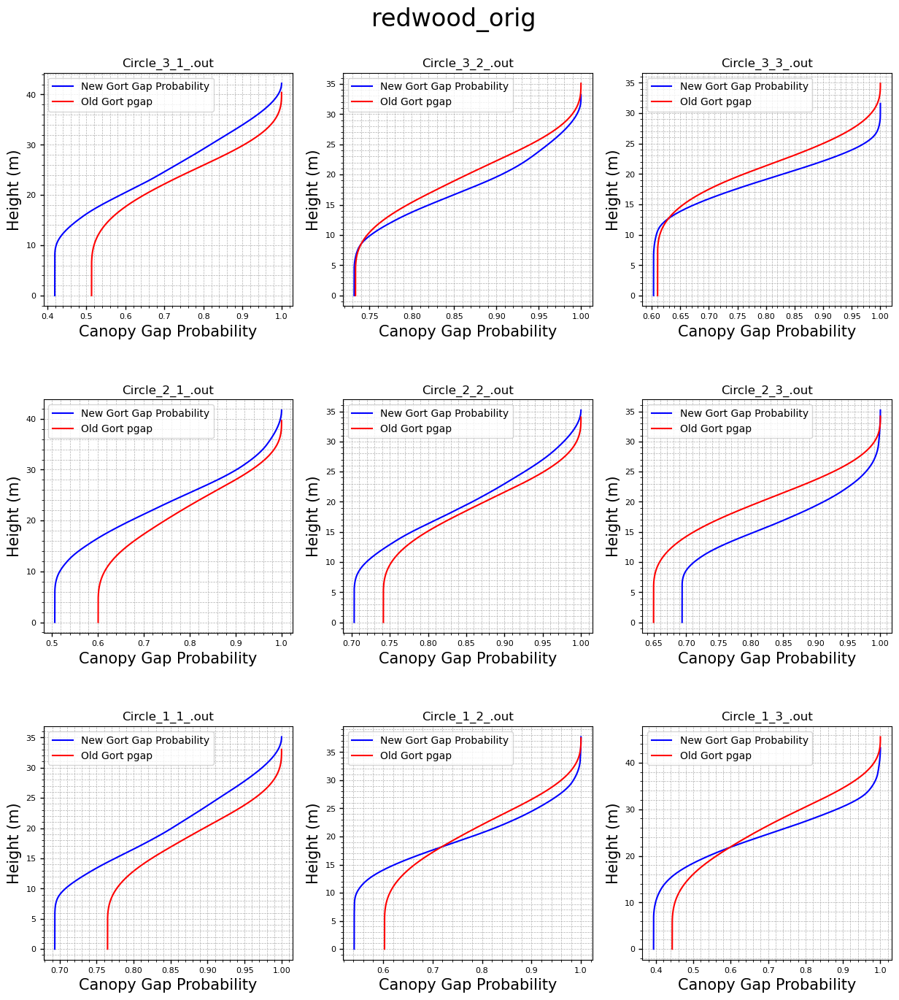

Circle_3_1_branch redwood_orig_with_branch
Circle_3_2_branch redwood_orig_with_branch
Circle_3_3_branch redwood_orig_with_branch
Circle_2_1_branch redwood_orig_with_branch
Circle_2_2_branch redwood_orig_with_branch
Circle_2_3_branch redwood_orig_with_branch
Circle_1_1_branch redwood_orig_with_branch
Circle_1_2_branch redwood_orig_with_branch
Circle_1_3_branch redwood_orig_with_branch
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/gap_probability/redwood_orig_with_branch.pdf


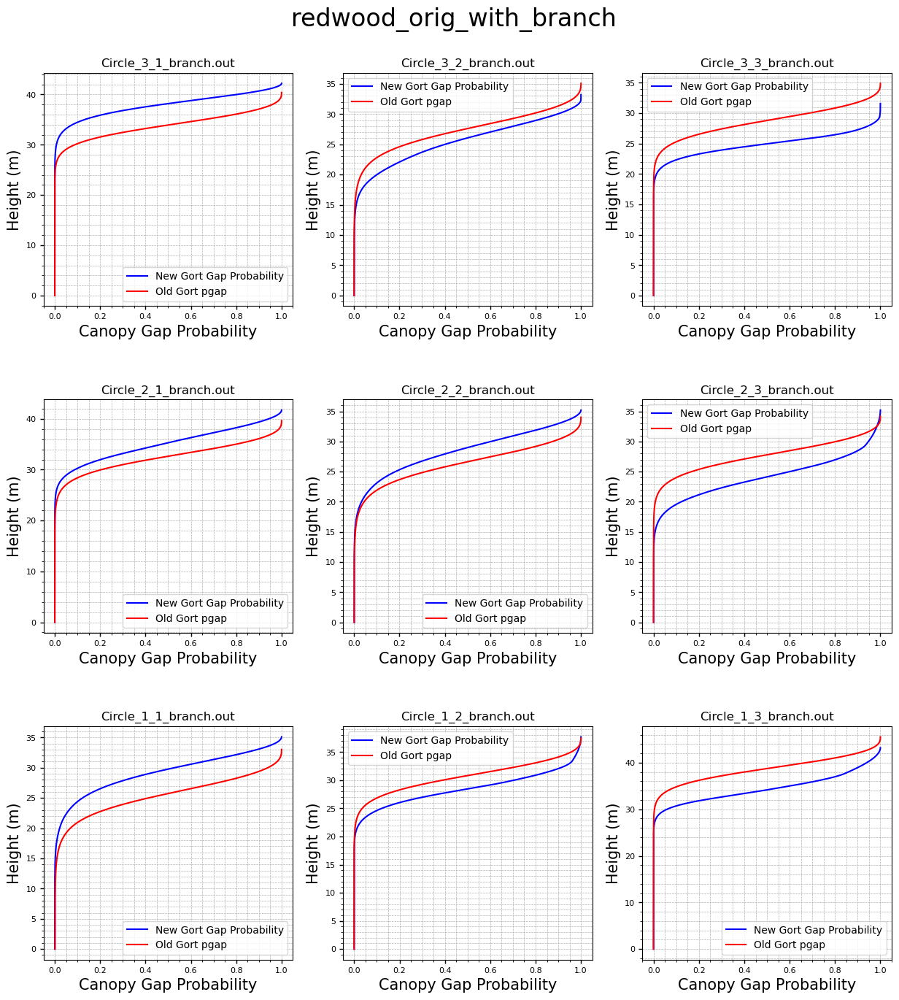

Circle_3_1_ redwood_origB10th
Circle_3_2_ redwood_origB10th
Circle_3_3_ redwood_origB10th
Circle_2_1_ redwood_origB10th
Circle_2_2_ redwood_origB10th
Circle_2_3_ redwood_origB10th
Circle_1_1_ redwood_origB10th
Circle_1_2_ redwood_origB10th
Circle_1_3_ redwood_origB10th
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/gap_probability/redwood_origB10th.pdf


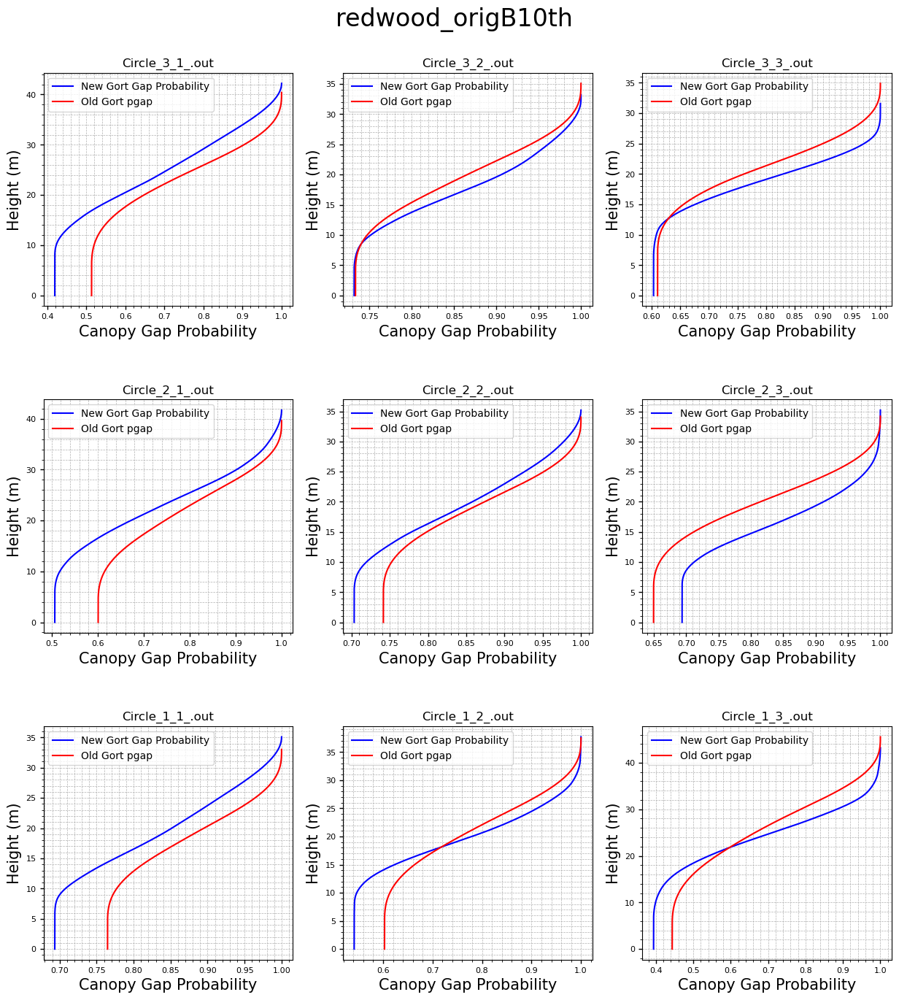

Circle_3_1_branch redwood_origB10th_with_branch
Circle_3_2_branch redwood_origB10th_with_branch
Circle_3_3_branch redwood_origB10th_with_branch
Circle_2_1_branch redwood_origB10th_with_branch
Circle_2_2_branch redwood_origB10th_with_branch
Circle_2_3_branch redwood_origB10th_with_branch
Circle_1_1_branch redwood_origB10th_with_branch
Circle_1_2_branch redwood_origB10th_with_branch
Circle_1_3_branch redwood_origB10th_with_branch
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/gap_probability/redwood_origB10th_with_branch.pdf


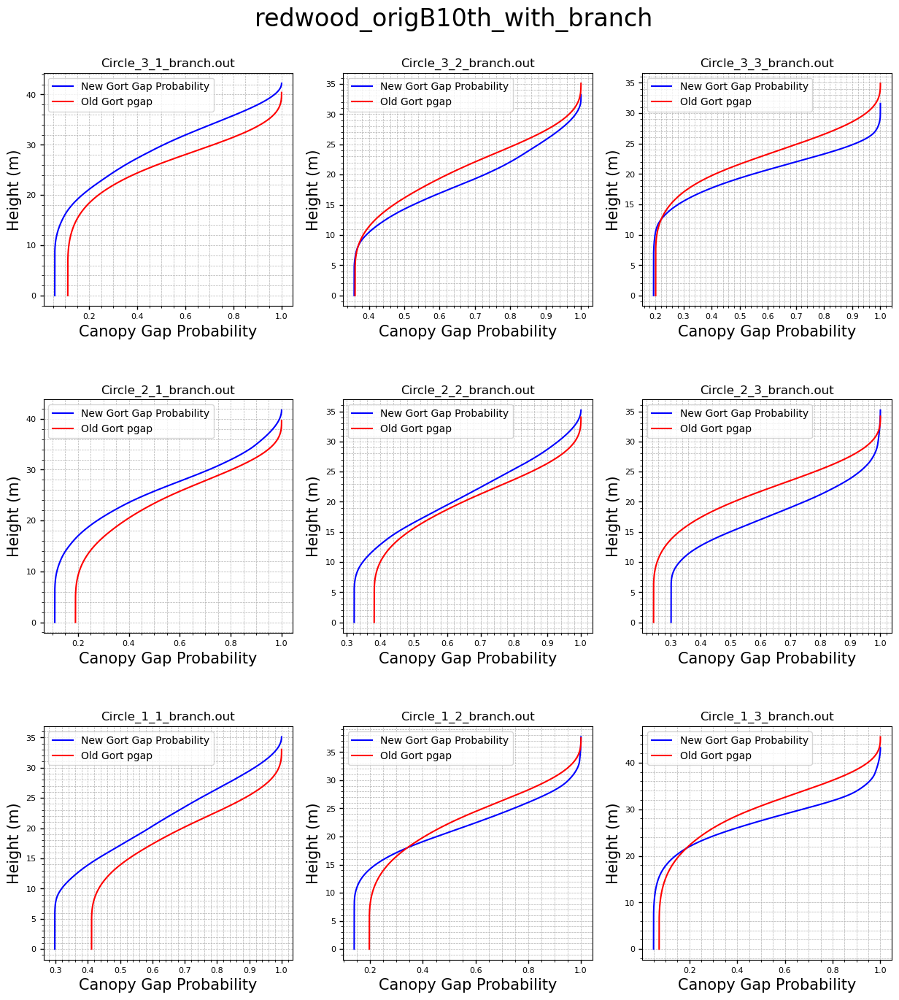

Circle_3_1_ guiana_orig
Circle_3_2_ guiana_orig
Circle_3_3_ guiana_orig
Circle_2_1_ guiana_orig
Circle_2_2_ guiana_orig
Circle_2_3_ guiana_orig
Circle_1_1_ guiana_orig
Circle_1_2_ guiana_orig
Circle_1_3_ guiana_orig
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/gap_probability/guiana_orig.pdf


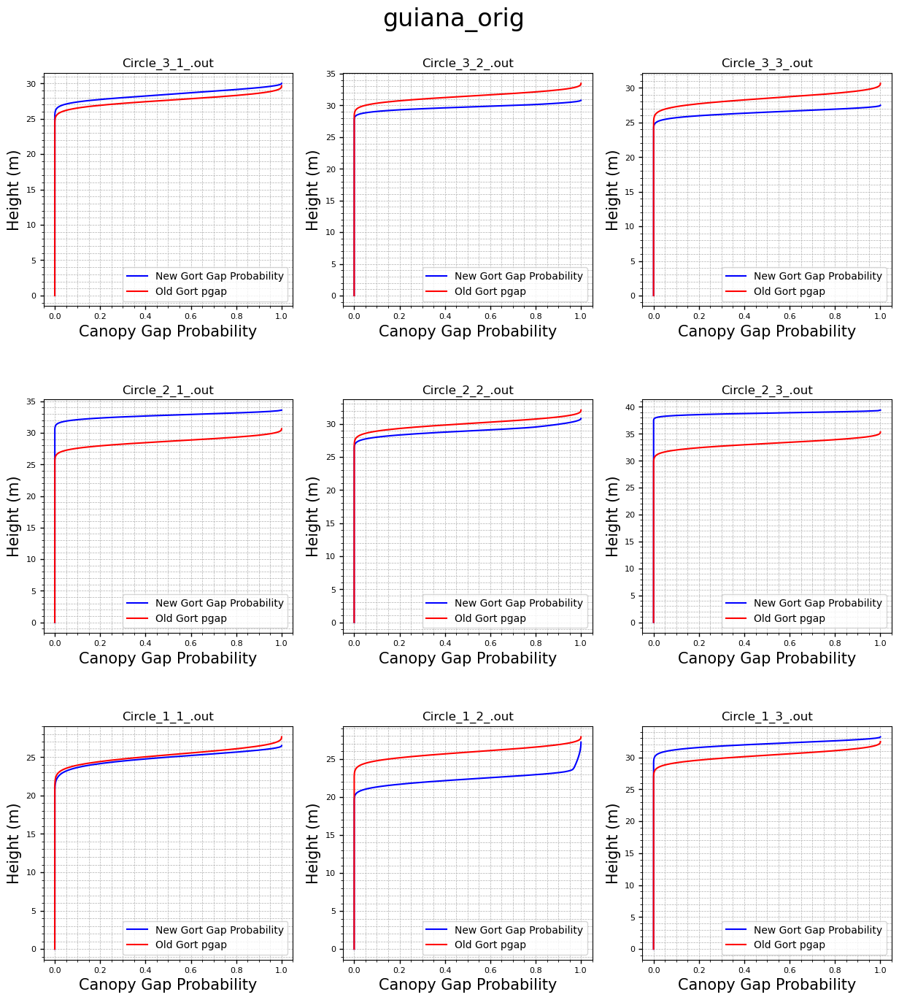

Circle_3_1_branch guiana_orig_with_branch
Circle_3_2_branch guiana_orig_with_branch
Circle_3_3_branch guiana_orig_with_branch
Circle_2_1_branch guiana_orig_with_branch
Circle_2_2_branch guiana_orig_with_branch
Circle_2_3_branch guiana_orig_with_branch
Circle_1_1_branch guiana_orig_with_branch
Circle_1_2_branch guiana_orig_with_branch
Circle_1_3_branch guiana_orig_with_branch
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/gap_probability/guiana_orig_with_branch.pdf


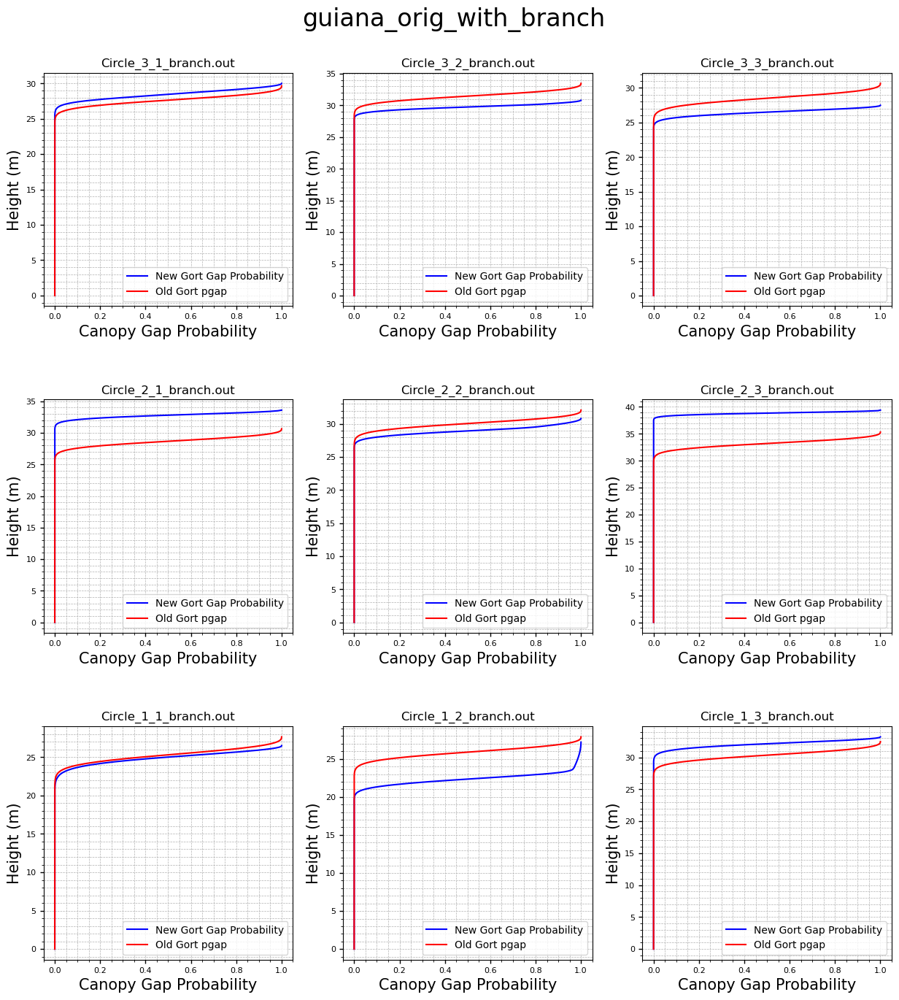

Circle_3_1_ guiana_origLD10th
Circle_3_2_ guiana_origLD10th
Circle_3_3_ guiana_origLD10th
Circle_2_1_ guiana_origLD10th
Circle_2_2_ guiana_origLD10th
Circle_2_3_ guiana_origLD10th
Circle_1_1_ guiana_origLD10th
Circle_1_2_ guiana_origLD10th
Circle_1_3_ guiana_origLD10th
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/gap_probability/guiana_origLD10th.pdf


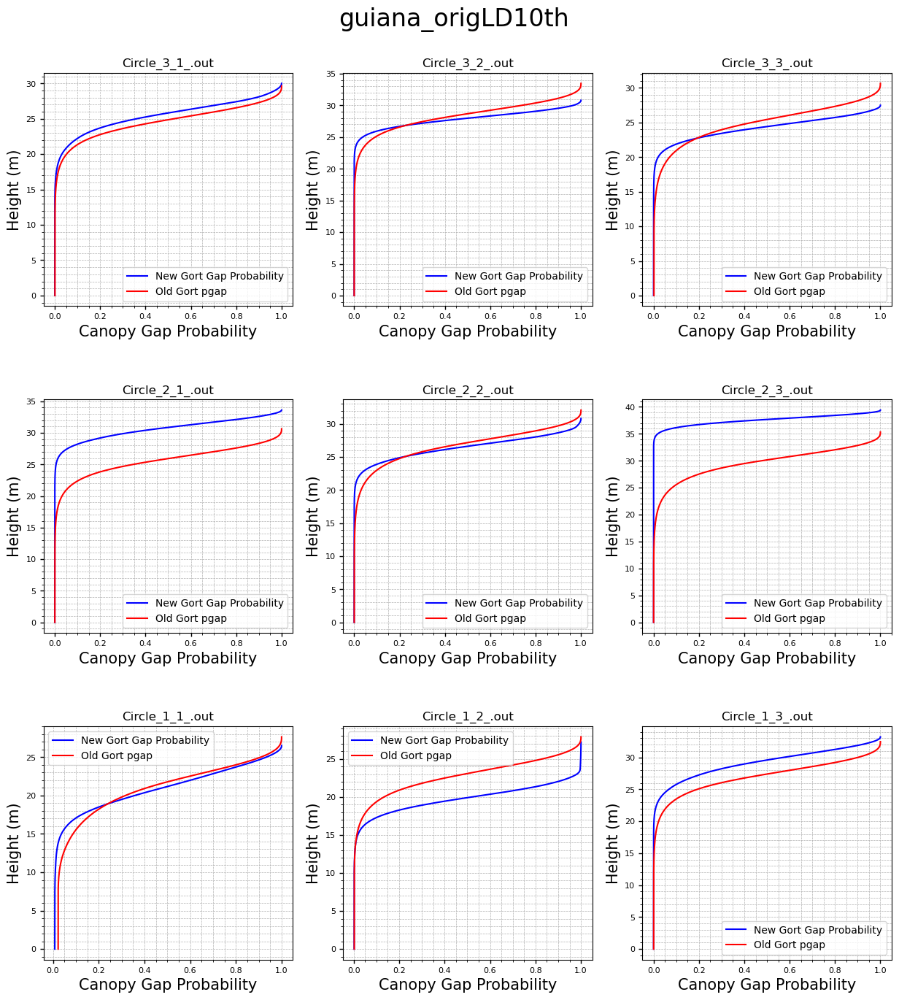

Circle_3_1_branch guiana_origLD10th_with_branch
Circle_3_2_branch guiana_origLD10th_with_branch
Circle_3_3_branch guiana_origLD10th_with_branch
Circle_2_1_branch guiana_origLD10th_with_branch
Circle_2_2_branch guiana_origLD10th_with_branch
Circle_2_3_branch guiana_origLD10th_with_branch
Circle_1_1_branch guiana_origLD10th_with_branch
Circle_1_2_branch guiana_origLD10th_with_branch
Circle_1_3_branch guiana_origLD10th_with_branch
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/gap_probability/guiana_origLD10th_with_branch.pdf


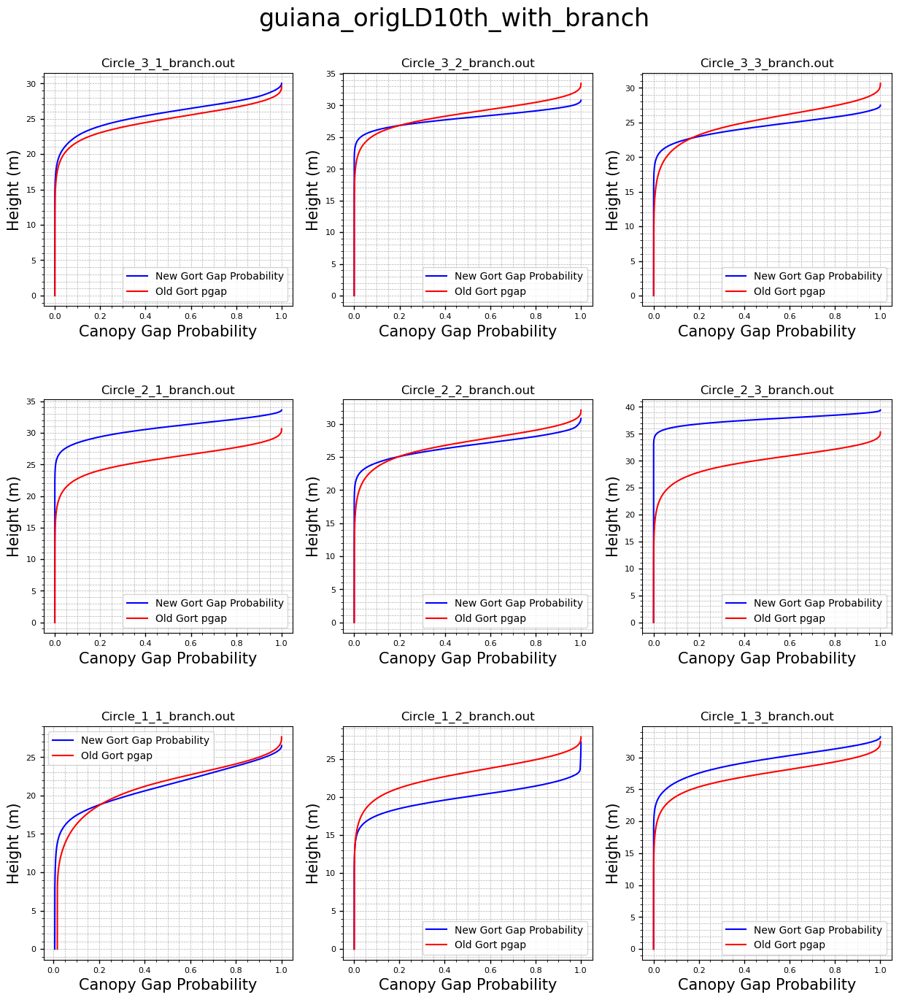

Circle_3_1_ guiana_origLD30th
Circle_3_2_ guiana_origLD30th
Circle_3_3_ guiana_origLD30th
Circle_2_1_ guiana_origLD30th
Circle_2_2_ guiana_origLD30th
Circle_2_3_ guiana_origLD30th
Circle_1_1_ guiana_origLD30th
Circle_1_2_ guiana_origLD30th
Circle_1_3_ guiana_origLD30th
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/gap_probability/guiana_origLD30th.pdf


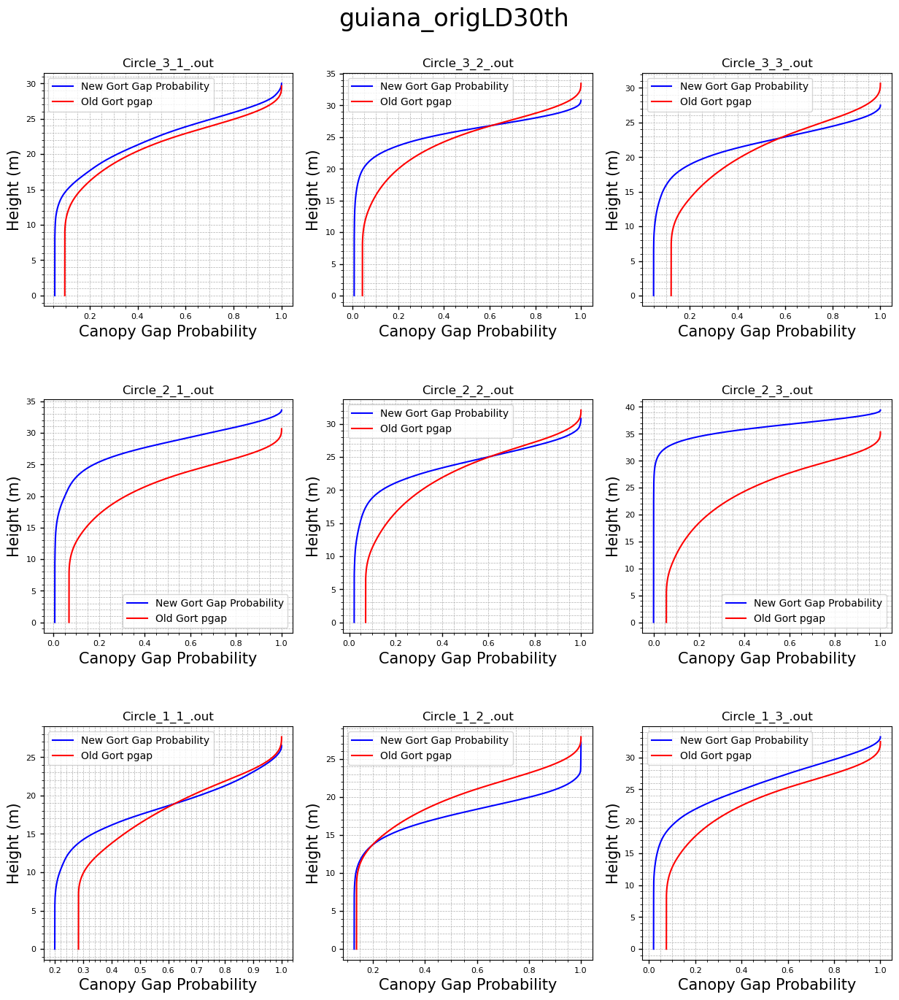

Circle_3_1_branch guiana_origLD30th_with_branch
Circle_3_2_branch guiana_origLD30th_with_branch
Circle_3_3_branch guiana_origLD30th_with_branch
Circle_2_1_branch guiana_origLD30th_with_branch
Circle_2_2_branch guiana_origLD30th_with_branch
Circle_2_3_branch guiana_origLD30th_with_branch
Circle_1_1_branch guiana_origLD30th_with_branch
Circle_1_2_branch guiana_origLD30th_with_branch
Circle_1_3_branch guiana_origLD30th_with_branch
/data/shared/src/STV/simscenes/LidarSimulation/figs/IDL_combined_output/2024_09_20/gap_probability/guiana_origLD30th_with_branch.pdf


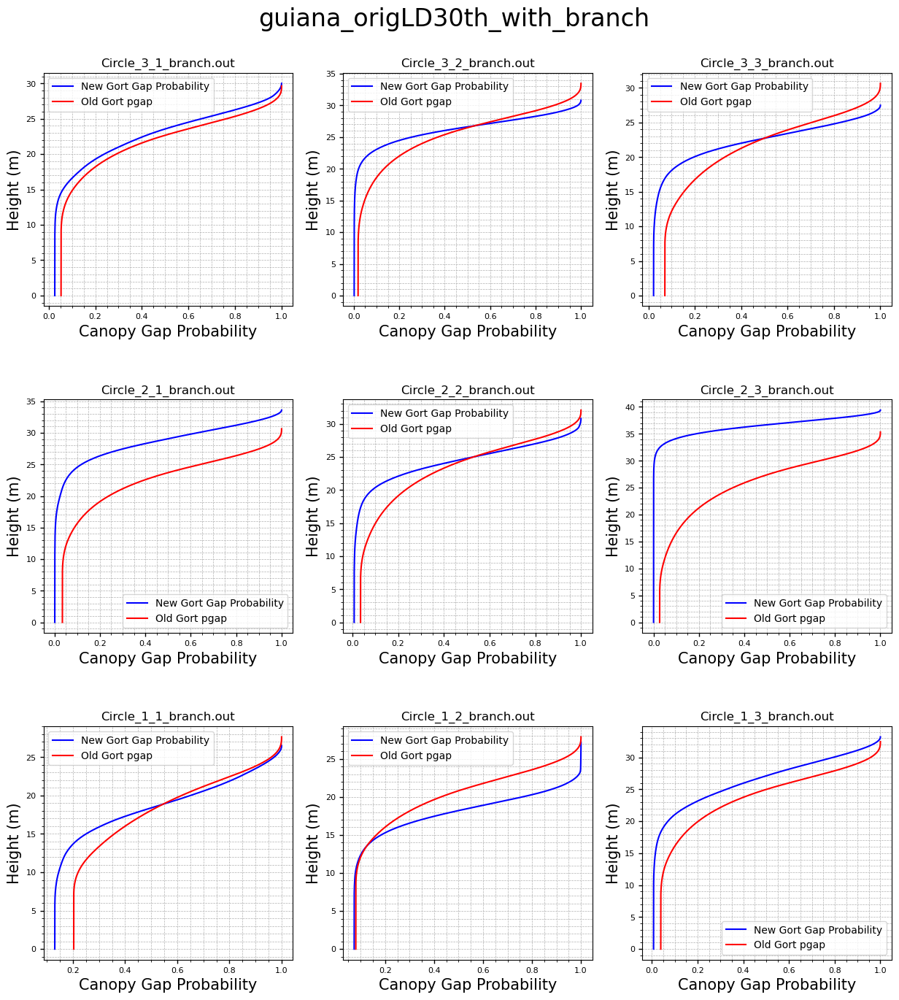

In [156]:
generate_pgap_plots(LidarSim_gort_out_dir, Combined_plot_dir)